In [1]:
import mne
import numpy as np
import matplotlib.pyplot as plt
from config import channel_order
import matplotlib.pyplot as plt
from matplotlib import rcParams


Plot Grand average ERP accross subjects

In [9]:
myColors = ["#403990", "#80A6E2", "#FBDD85", "#F46F43", "#CF3D3E","#77DD77"]



In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pickle
from config import filt_trigger, channel_plot_order, channel_order
from tqdm import tqdm
import os
from scipy.stats import wilcoxon, ttest_rel
from statsmodels.stats.multitest import multipletests
from copy import deepcopy

def plotGrandERP(baseline, interval, triggers, fig=None, axes=None, label=None, color=None, eventAdjust=None, eventOffset=0):
    if len(triggers) == 0:
        print("No trigger meet the condition.")
        return fig, axes, None

    ch_plot_order = np.array(channel_plot_order).transpose(1, 0)[::-1]
    if fig is None or axes is None:
        fig, axes = plt.subplots(nrows=5, ncols=6, sharey=True, layout="tight", figsize=(25.5, 13.25))
    grandERP = None
    if eventAdjust is None:
        eventAdjust = dict()
    for sid in tqdm(range(1, 27)):
        for session in [1, 2]:
            sessionDataPath = f"../../dataset_noAvgRef_ASR_ICA/S{sid:03d}/session_{session}/task_250_clean.set"
            if not os.path.exists(sessionDataPath):
                continue
            with mne.utils.use_log_level("Error"):
                raw = mne.io.read_raw_eeglab(sessionDataPath, preload=False)
                events, eventMap = mne.events_from_annotations(raw)
                # print(events)
                # print(eventMap)
                for eventId, latency in eventAdjust.items():
                    events[events[:, 2] == eventMap[eventId], 0] += int(latency * raw.info['sfreq'])  # music_D
                eventIds = [eventMap[t.split("_")[-1]] for t in triggers]
                eventMask = np.isin(events[:, 2], eventIds)
                if eventOffset < 0:
                    eventMask[:eventOffset] = eventMask[-eventOffset:]
                    eventMask[eventOffset:] = False
                elif eventOffset > 0:
                    eventMask[eventOffset:] = eventMask[:-eventOffset]
                    eventMask[-eventOffset:] = False
                selectedEvents = events[eventMask]
                epochs = mne.Epochs(raw, selectedEvents, event_id=None, 
                        tmin=interval[0], tmax=interval[1], baseline=(interval[0], interval[0]+baseline), preload=True)
                # print(epochs.get_data().shape)
                #個人的平均 (*10**6 volt -> micro volt)
                sessionERP = epochs.average().data[np.newaxis, ...] * 10**6
            # print(sessionERP.shape)
            if sessionERP.shape[0] != 0:
                grandERP =  deepcopy(sessionERP) if grandERP is None else np.vstack((grandERP, sessionERP))
                # grandERP = np.vstack((grandERP, sessionERP.mean(axis=0, keepdims=True)))
    if grandERP is None:
        # print("No trial meet the condition.")
        return
    # fig.suptitle(f"trigger: {triggers}, trials: {grandERP.shape[0]}")
    print(f"trigger: {triggers}, trials: {grandERP.shape[0]}")
    #所有人的平均(46)
    grandERPMean = grandERP.mean(axis=0)
    baselineLength = int(baseline * 250)
    for rax, rch in zip(axes, ch_plot_order):
        for ax, ch in zip(rax, rch):
            ch_id = channel_order.index(ch)
            ax.set_title(ch)
            # ax.fill_between(np.arange(grandERPMean.shape[-1]), grandERPMean[ch_id, :] + grandERP_stderr[ch_id, :], grandERPMean[ch_id, :] - grandERP_stderr[ch_id, :], alpha=0.5)
            if color is None:
                ax.plot(grandERPMean[ch_id, :], label="ERP" if label is None else f"ERP_{label}")
            else:
                ax.plot(grandERPMean[ch_id, :], label="ERP" if label is None else f"ERP_{label}", color=color)
            xticks = np.array([0, *np.arange(0, interval[1]-interval[0]+0.1, step=0.1)]) * 250
            ax.set_xticks(xticks.astype(int))
            ax.set_xticklabels((ax.get_xticks() - baselineLength) / 250)
            ax.tick_params(axis='x', labelrotation=90)
            # ax.set_ylim(-10, 10)
            # ax.set_ylim(-1.2, 1.2)
            ax.set_xlim(baselineLength-25, (interval[1]-interval[0])*250)
            ax.grid("on")
    axes[0, -1].legend(loc='upper left', bbox_to_anchor=(1, 1))
    plt.show()
    return fig, axes, grandERP

def getConsecutiveIntervals(arr):
    intervals = []
    start = None
    for i, value in enumerate(arr):
        if value and start is None:
            start = i
        elif not value and start is not None:
            intervals.append((start, i - 1))
            start = None
    if start is not None:
        intervals.append((start, len(arr) - 1))
    return intervals

def plotSignificantIntervalOfERP(grandERPs, baseline, fig, axes, test="wilcoxon", barHeight=0.4):
    baselineLength = int(baseline*250)
    grandERPs = np.transpose(grandERPs, (0, 1, 3, 2))  # -> (condition, trials, timepoints, electrodes)
    nCombinations, nTimepoints, nChannels = grandERPs.shape[0] * (grandERPs.shape[0] - 1) // 2, grandERPs.shape[2] - baselineLength, grandERPs.shape[3]
    pValues = np.zeros((nCombinations, nTimepoints, nChannels))
    combinationId = 0
    for cond_i in range(grandERPs.shape[0]):
        for cond_j in range(cond_i+1, grandERPs.shape[0]):
            for t in range(nTimepoints):
                for c in range(nChannels):
                    # print(cond_i)
                    # print(cond_j)
                    # print(t)
                    # print(c)
                    if test == "wilcoxon":
                        _, pValues[combinationId, t, c] = wilcoxon(grandERPs[cond_i, :, t+baselineLength, c], grandERPs[cond_j, :, t+baselineLength, c])
                    elif test == "ttest_rel":
                        _, pValues[combinationId, t, c] = ttest_rel(grandERPs[cond_i, :, t+baselineLength, c], grandERPs[cond_j, :, t+baselineLength, c])
                    else:
                        raise NotImplementedError
            combinationId += 1
    # print(np.any(pValues<0.05))

    # all together
    pValues = pValues.reshape(-1)
    reject, pCorrected, _, _ = multipletests(pValues, alpha=0.05, method='fdr_bh')
    # pair-wise
    # pValues = pValues.reshape(nCombinations, -1)
    # reject = np.zeros_like(pValues, dtype=bool)
    # pCorrected = np.zeros_like(pValues)
    # for pairId, pValue in enumerate(pValues):
    #     reject[pairId], pCorrected[pairId], _, _ = multipletests(pValue, alpha=0.05, method='fdr_bh')
    
    reject = reject.reshape(nCombinations, nTimepoints, nChannels)
    pCorrected = pCorrected.reshape(nCombinations, nTimepoints, nChannels)
    print(f"Exists statistical significance: {np.any(reject)}")
    grandERPs = grandERPs.mean(axis=1)
    
    ch_plot_order = np.array(channel_plot_order).transpose(1, 0)[::-1]
    colors = [line.get_color() for line in axes[0, 0].get_lines()]
    for rax, rch in zip(axes, ch_plot_order):
        for ax, ch in zip(rax, rch):
            ch_id = channel_order.index(ch)
            combinationId = 0
            minV, maxV = grandERPs[:, :, ch_id].min(), grandERPs[:, :, ch_id].max()
            for cond_i in range(grandERPs.shape[0]):
                for cond_j in range(cond_i+1, grandERPs.shape[0]):
                    significantIntervals = getConsecutiveIntervals(reject[combinationId, :, ch_id])
                    if abs(minV) < abs(maxV):
                        y = minV - (barHeight+0.15) * (combinationId+1)
                    else:
                        y = maxV + (barHeight+0.15) * (combinationId+1)
                    #畫色塊
                    ax.vlines(baselineLength-20, y - barHeight / 2, y + barHeight / 2, color=colors[cond_i], lw=5)
                    ax.vlines(baselineLength-10, y - barHeight / 2, y + barHeight / 2, color=colors[cond_j], lw=5)
                    
                    for significantInterval in significantIntervals:
                        st, end = significantInterval[0] + baselineLength, significantInterval[1] + baselineLength
                        # if end - st < 5:
                        #     continue
                        # print(f"{ch}: {st} ~ {end}")
                        # minV, maxV = grandERPs[:, st:end+1, ch_id].min(), grandERPs[:, st:end+1, ch_id].max()
                            
                        ax.plot([st, end], [y, y], color='black', lw=0.7)  # lw: line width
                    combinationId += 1

                    # 在两个颜色条之间的右侧添加 "vs" 标签
                    x_vs = (baselineLength - 20 + baselineLength - 10) / 2    # 调整x位置
                    y_vs = y  # y位置保持在中间
                    ax.text(x_vs, y_vs, "vs", ha='center', va='center', fontsize=8, color='black')
                    
                
    return fig, axes, pCorrected

def plot10ChannelERP(erps, baseline, interval, pValues, labels, colors, barHeight=0.4):
    assert len(erps) == len(labels)
    fig, axes = plt.subplots(nrows=4, ncols=3, sharex=True, sharey=True, layout="tight", figsize=(12, 10))
    channelNames = np.array([[  "", "FCz", ""],
                             ["T7",  "Cz", "T8"],
                             ["P7",  "Pz", "P8"],
                             ["O1",  "Oz", "O2"],]).flatten()
    baselineLength = int(baseline * 250)
    erps = np.array(erps).mean(axis=1)
    axes = axes.flatten()
    axes[0].axis('off')
    axes[2].axis('off')    
    reject = pValues < 0.05 if pValues is not None else None
    for erpId, (erp, label) in enumerate(zip(erps, labels)):
        for ax, ch in zip(axes, channelNames):
            if ch == "":
                continue
            chId = channel_order.index(ch)
            ax.text(0.01, 0.99, ch, transform=ax.transAxes,
                    fontsize=12, verticalalignment='top', horizontalalignment='left')
            ax.plot(erp[chId], label="ERP" if label is None else f"{label}", color=colors[erpId])
            xticks = np.array([0, *np.arange(baseline, interval[1]-interval[0]+0.1, step=0.1)]) * 250
            ax.set_xticks(xticks.astype(int))
            ax.set_xticklabels((ax.get_xticks() - baselineLength) / 250)
            ax.tick_params(axis='x', labelrotation=90)
            ax.set_xlim(baselineLength-25, (interval[1]-interval[0])*250)
            ax.grid("on", alpha=0.3)
            
            if reject is None:
                continue            
            combinationId = 0
            minV, maxV = erps[:, chId, :].min(), erps[:, chId, :].max()
            for cond_i in range(erps.shape[0]):
                for cond_j in range(cond_i+1, erps.shape[0]):
                    significantIntervals = getConsecutiveIntervals(reject[combinationId, :, chId])
                    y = minV - (barHeight+0.15) * (combinationId+1)
                    # if abs(minV) < abs(maxV):
                    #     y = minV - (barHeight+0.15) * (combinationId+1)
                    # else:
                    #     y = maxV + (barHeight+0.15) * (combinationId+1)
                    #畫色塊
                    ax.vlines(baselineLength-20, y - barHeight / 2, y + barHeight / 2, color=colors[cond_i], lw=5)
                    ax.vlines(baselineLength-10, y - barHeight / 2, y + barHeight / 2, color=colors[cond_j], lw=5)
                    for significantInterval in significantIntervals:
                        st, end = significantInterval[0] + baselineLength, significantInterval[1] + baselineLength
                        # if end - st < 5:
                        #     continue
                        # print(f"{ch}: {st} ~ {end}")
                        # minV, maxV = grandERPs[:, st:end+1, ch_id].min(), grandERPs[:, st:end+1, ch_id].max()
                            
                        ax.plot([st, end], [y, y], color='black', lw=0.7)  # lw: line width
                        
                    combinationId += 1
                    # 在两个颜色条之间的右侧添加 "vs" 标签
                    x_vs = (baselineLength - 20 + baselineLength - 10) / 2    # 调整x位置
                    y_vs = y  # y位置保持在中间
                    ax.text(x_vs, y_vs, "vs", ha='center', va='center', fontsize=8, color='black')
                    
                    

            
            # ax.set_ylim(-10, 10)
            # ax.set_ylim(-1.2, 1.2)



    for color, label in zip(colors, labels):
        axes[2].plot(-100, 0, label="ERP" if label is None else f"{label}", color=color)
    

    axes[2].legend(
        loc='upper left', 
        prop={'size': 20}
    )   
    axes[6].set_ylabel("ERP (µV)")
    axes[10].set_xlabel("Time (s)")
    return fig, axes

    
    

stimuli onset visual

100%|██████████| 26/26 [00:19<00:00,  1.36it/s]


trigger: ['stimuli_21'], trials: 46


100%|██████████| 26/26 [00:15<00:00,  1.69it/s]


trigger: ['stimuli_22'], trials: 46


100%|██████████| 26/26 [00:17<00:00,  1.53it/s]


trigger: ['stimuli_23'], trials: 46
Exists statistical significance: True


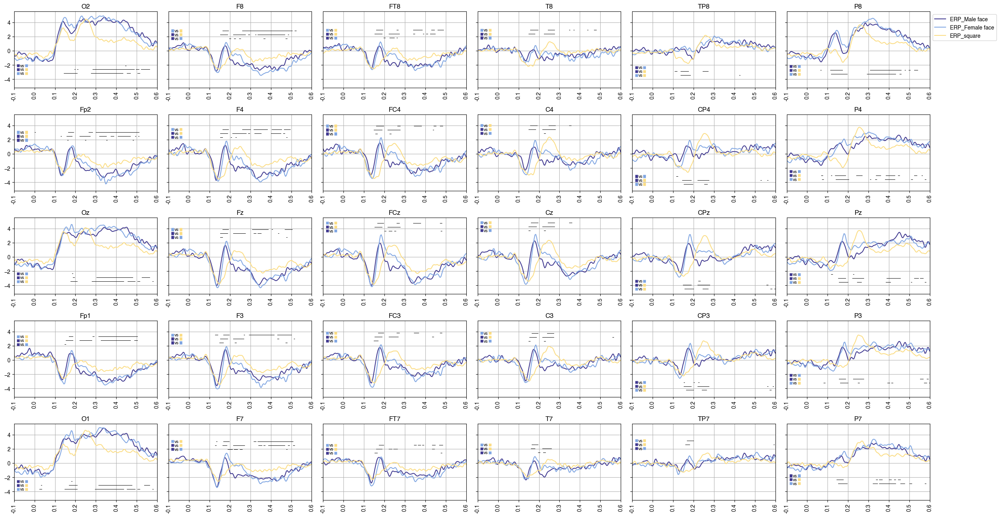

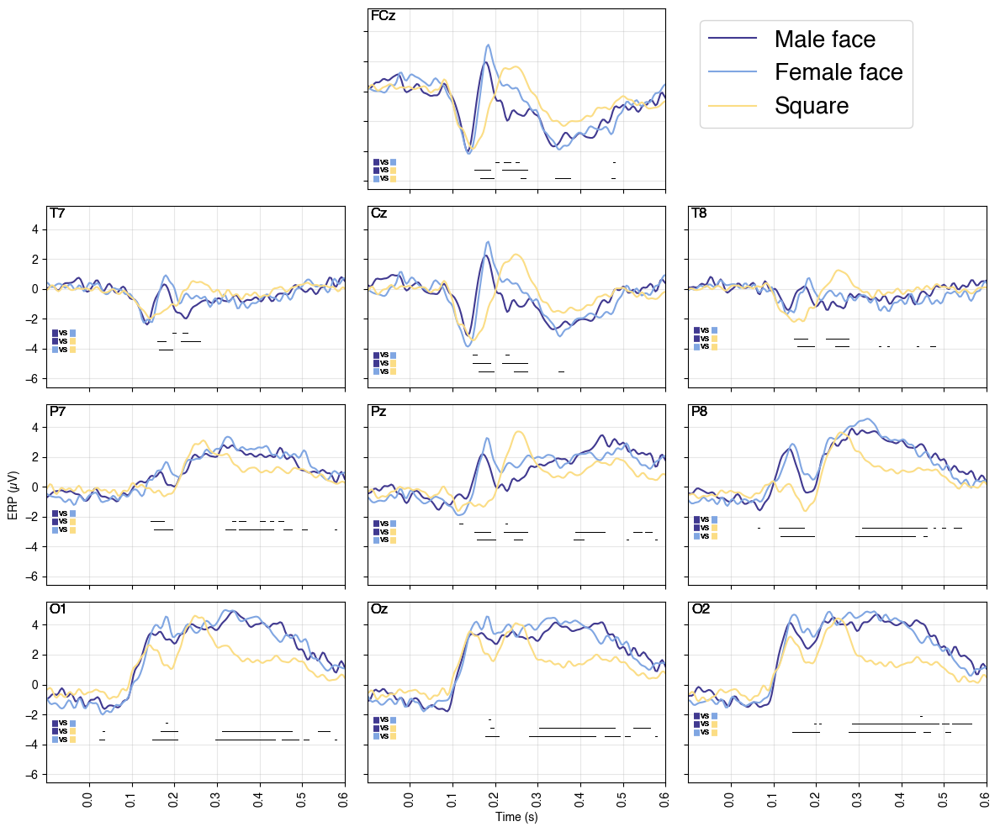

In [ ]:
interval = [-1, 0.6]
fig, axes, erp1 = plotGrandERP(baseline = 1, interval = interval, triggers=filt_trigger(["stimuli_21"], [], [], []), label="Male face", color=myColors[0])
_, _, erp2 = plotGrandERP(baseline = 1, interval = interval, triggers=filt_trigger(["stimuli_22"], [], [], []), fig=fig, axes=axes, label="Female face", color=myColors[1])
_, _, erp3 = plotGrandERP(baseline = 1, interval = interval, triggers=filt_trigger(["stimuli_23"], [], [], []), fig=fig, axes=axes, label="square", color=myColors[2])
fig, axes, pValues = plotSignificantIntervalOfERP(grandERPs = np.array([erp1, erp2, erp3]), baseline = 1, fig=fig, axes=axes, test="wilcoxon")
plot10ChannelERP(erps=[erp1, erp2, erp3], baseline=1, interval=interval, pValues=pValues, colors=[line.get_color() for line in axes[0, 0].get_lines()], labels=["Male face", "Female face", "Square"])

plt.savefig("../result/visual.png", dpi=300, bbox_inches="tight")  
plt.show()


stimuli onset: face V.S. square

100%|██████████| 26/26 [00:20<00:00,  1.24it/s]


trigger: ['stimuli_21', 'stimuli_22'], trials: 46


100%|██████████| 26/26 [00:20<00:00,  1.29it/s]


trigger: ['stimuli_23'], trials: 46
Exists statistical significance: True


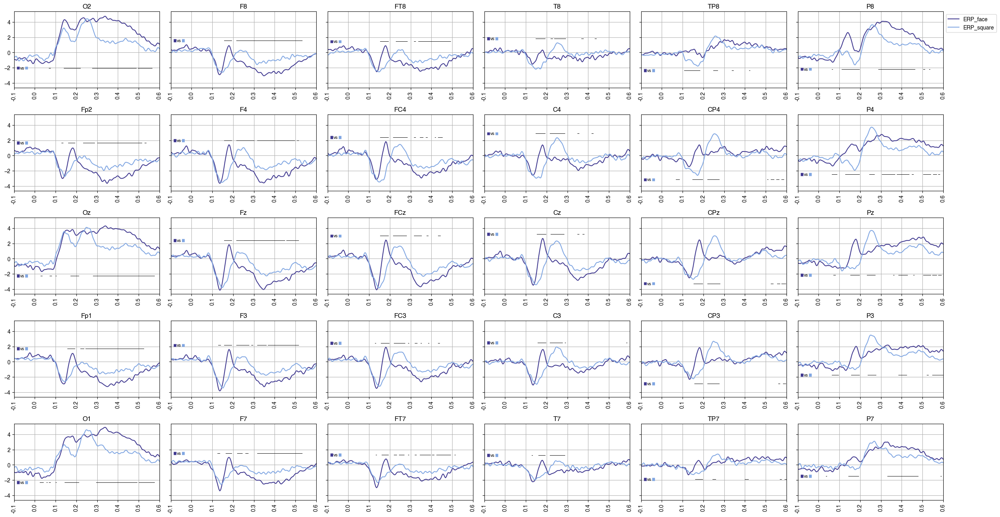

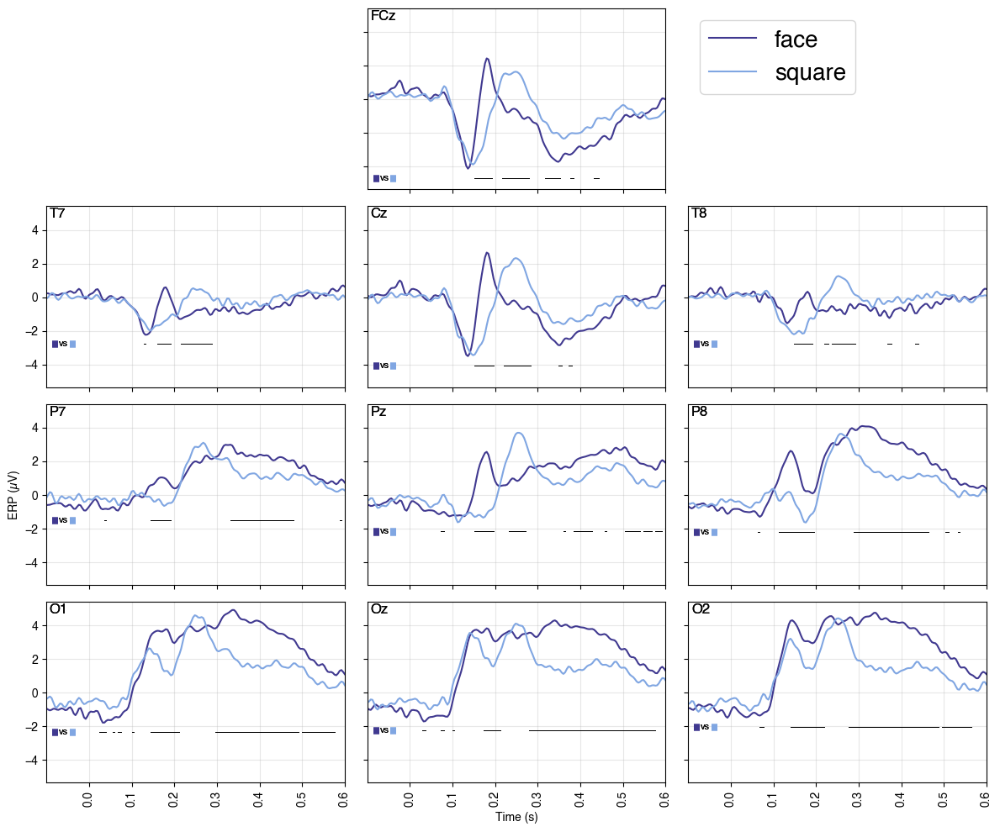

In [ ]:
interval = [-1, 0.6]
fig, axes, erp1 = plotGrandERP(baseline = 1, interval = interval, triggers=filt_trigger(["stimuli_21", "stimuli_22"], [], [], []), label="face", color=myColors[0])
_, _, erp2 = plotGrandERP(baseline = 1, interval = interval, triggers=filt_trigger(["stimuli_23"], [], [], []), fig=fig, axes=axes, label="square", color=myColors[1])
_, _, pValues = plotSignificantIntervalOfERP([erp1, erp2], baseline = 1, fig=fig, axes=axes, test="wilcoxon")
plot10ChannelERP(erps=[erp1, erp2], baseline=1, interval=interval, pValues=pValues, colors=[line.get_color() for line in axes[0, 0].get_lines()], labels=["face", "square"])
plt.savefig("face_vs_square_helvetica.png", dpi=300, bbox_inches="tight")  # 保存為高解析度的 PNG
plt.show()

stimuli onset vocal

100%|██████████| 26/26 [00:21<00:00,  1.21it/s]


trigger: ['stimuli_24'], trials: 46


100%|██████████| 26/26 [00:20<00:00,  1.29it/s]


trigger: ['stimuli_25'], trials: 46


100%|██████████| 26/26 [00:19<00:00,  1.35it/s]


trigger: ['stimuli_26'], trials: 46
Exists statistical significance: False


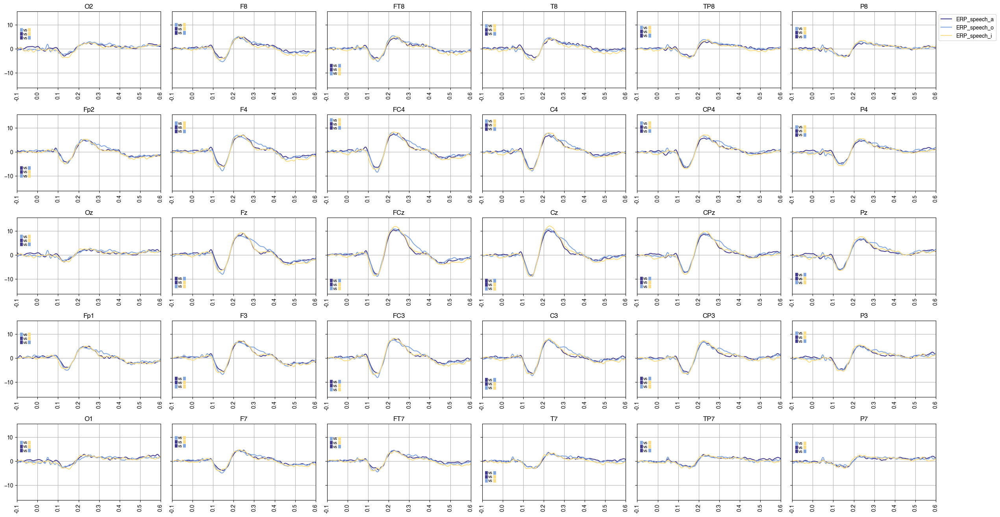

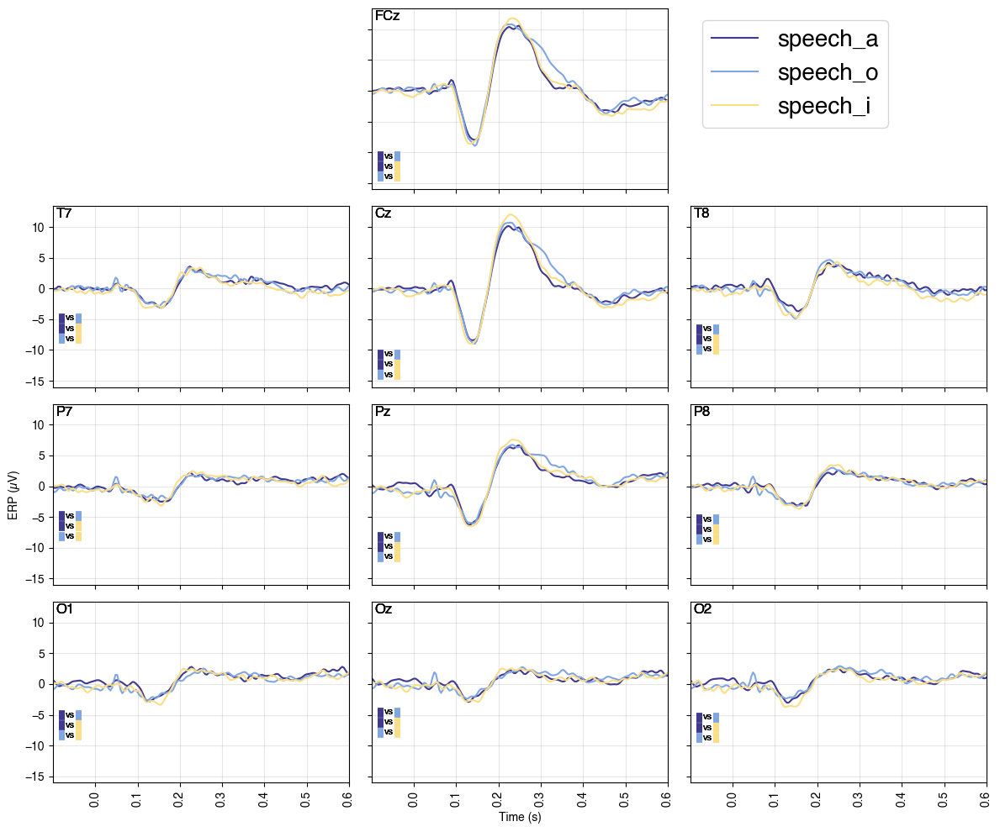

In [49]:
interval = [-1, 0.6]
fig, axes, erp1 = plotGrandERP(baseline = 1, interval = interval, triggers=filt_trigger(["stimuli_24"], [], [], []), label="speech_a", color=myColors[0])
_, _, erp2 = plotGrandERP(baseline = 1, interval = interval, triggers=filt_trigger(["stimuli_25"], [], [], []), fig=fig, axes=axes, label="speech_o", color=myColors[1])
_, _, erp3 = plotGrandERP(baseline = 1, interval = interval, triggers=filt_trigger(["stimuli_26"], [], [], []), fig=fig, axes=axes, label="speech_i", color=myColors[2])
_, _, pValues = plotSignificantIntervalOfERP([erp1, erp2, erp3], baseline = 1, fig=fig, axes=axes, test="wilcoxon", barHeight=1.5)
plot10ChannelERP(erps=[erp1, erp2, erp3], baseline=1, interval=interval, pValues=pValues, colors=[line.get_color() for line in axes[0, 0].get_lines()], labels=["speech_a", "speech_o", "speech_i"], barHeight=1.5)
# plt.show()
plt.savefig("speech_a_i_o.png", dpi=300, bbox_inches="tight")  # 保存為高解析度的 PNG
plt.show()

stimuli onset piano

100%|██████████| 26/26 [00:17<00:00,  1.48it/s]


trigger: ['stimuli_27'], trials: 46


100%|██████████| 26/26 [00:16<00:00,  1.59it/s]


trigger: ['stimuli_28'], trials: 46


100%|██████████| 26/26 [00:17<00:00,  1.52it/s]


trigger: ['stimuli_29'], trials: 46
Exists statistical significance: False


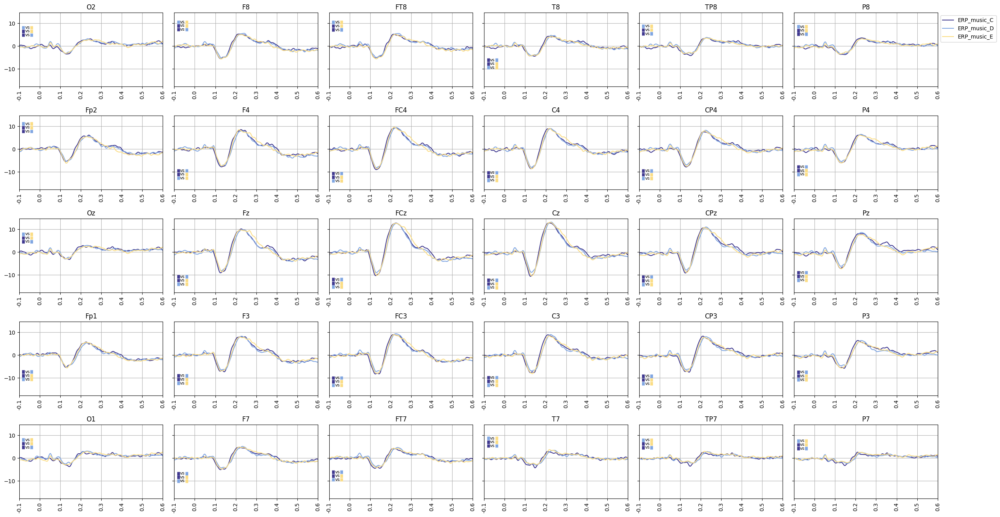

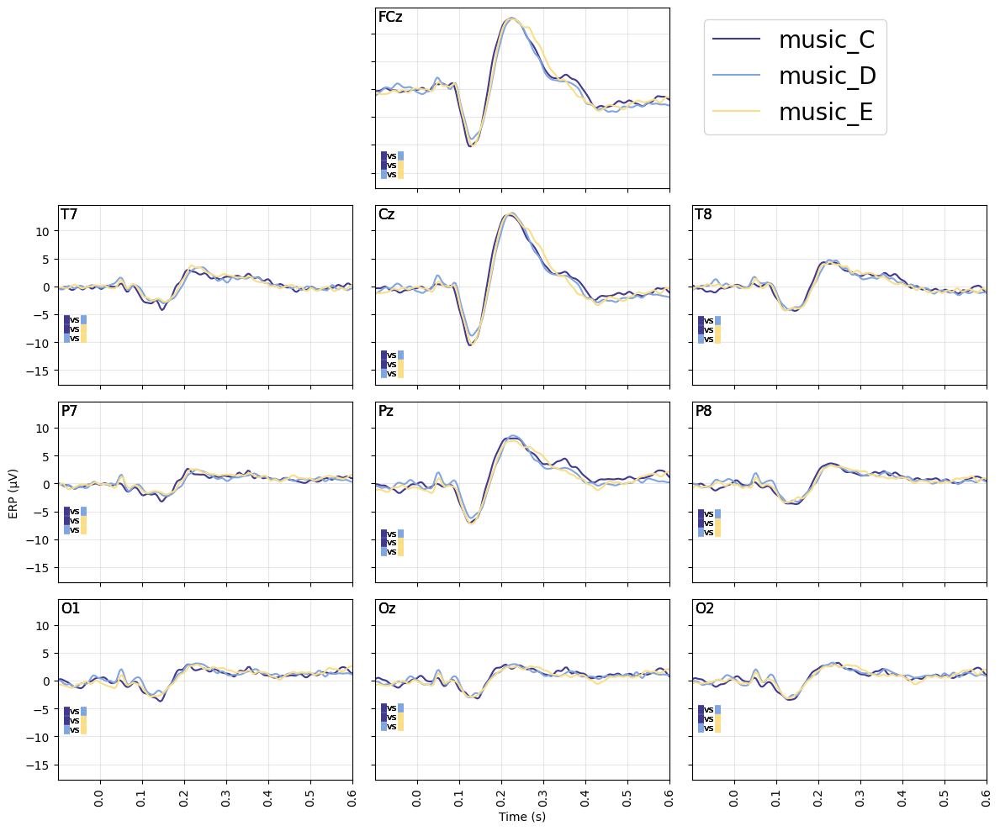

In [8]:
interval = [-1, 0.6]
fig, axes, erp1 = plotGrandERP(baseline = 1, interval = interval, triggers=filt_trigger(["stimuli_27"], [], [], []), label="music_C", color=myColors[0], eventAdjust={'27': 0.016})
_, _, erp2 = plotGrandERP(baseline = 1, interval = interval, triggers=filt_trigger(["stimuli_28"], [], [], []), fig=fig, axes=axes, label="music_D", color=myColors[1])
_, _, erp3 = plotGrandERP(baseline = 1, interval = interval, triggers=filt_trigger(["stimuli_29"], [], [], []), fig=fig, axes=axes, label="music_E", color=myColors[2])
_, _, pValues = plotSignificantIntervalOfERP([erp1, erp2, erp3], baseline = 1, fig=fig, axes=axes, test="wilcoxon", barHeight=1.5)
plot10ChannelERP(erps=[erp1, erp2, erp3], baseline=1, interval=interval, pValues=pValues, colors=[line.get_color() for line in axes[0, 0].get_lines()], labels=["music_C", "music_D", "music_E"], barHeight=1.5)
plt.show()

stimuli onset speech VS music

100%|██████████| 26/26 [00:18<00:00,  1.41it/s]


trigger: ['stimuli_25', 'stimuli_26', 'stimuli_24'], trials: 46


100%|██████████| 26/26 [00:18<00:00,  1.44it/s]


trigger: ['stimuli_29', 'stimuli_28', 'stimuli_27'], trials: 46
Exists statistical significance: True


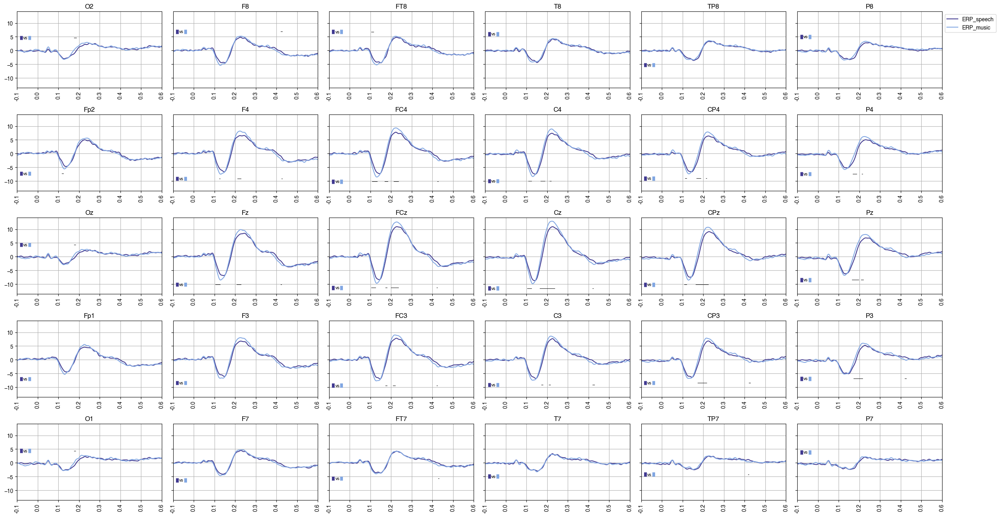

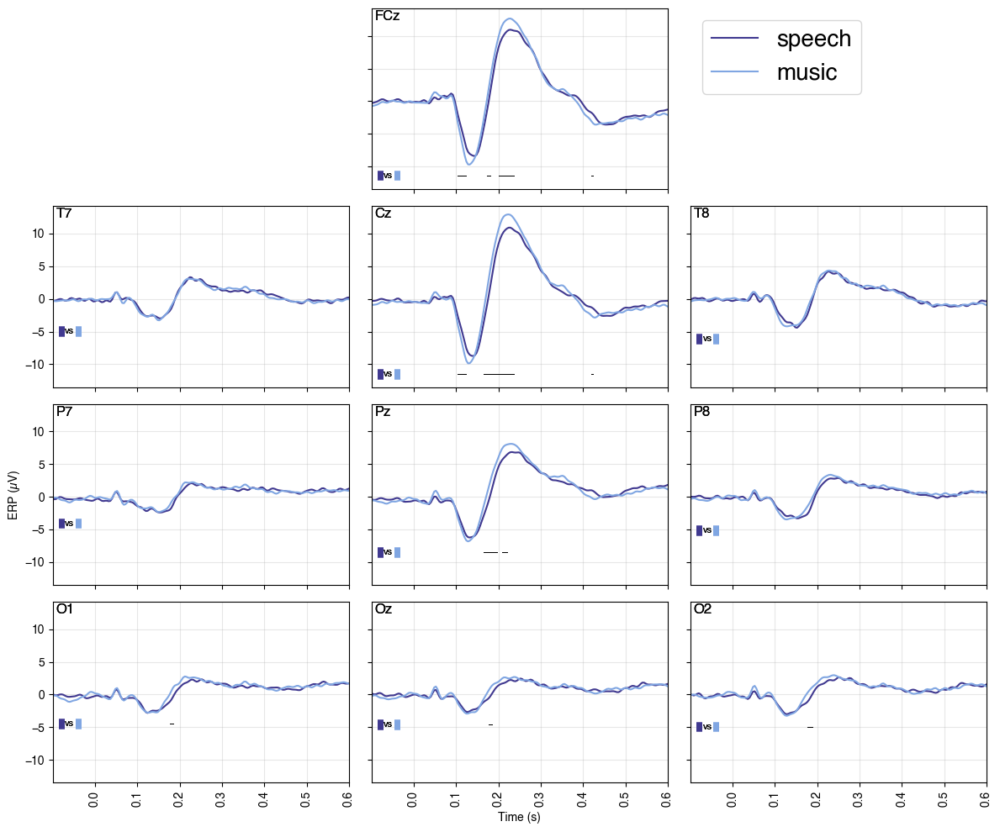

In [14]:
interval = [-1, 0.6]
fig, axes, erp1 = plotGrandERP(baseline = 1, interval = interval, triggers=filt_trigger([], [], ["stimuli_speech"], ["stimuli_mix"]), label="speech", color=myColors[0])
_, _, erp2 = plotGrandERP(baseline = 1, interval = interval, triggers=filt_trigger([], [], ["stimuli_music"], ["stimuli_mix"]), fig=fig, axes=axes, label="music", color=myColors[1], eventAdjust={'27': 0.016})
_, _, pValues = plotSignificantIntervalOfERP([erp1, erp2], baseline = 1, fig=fig, axes=axes, test="wilcoxon", barHeight=1.5)
plot10ChannelERP(erps=[erp1, erp2], baseline=1, interval=interval, pValues=pValues, colors=[line.get_color() for line in axes[0, 0].get_lines()], labels=["speech", "music"], barHeight=1.5)
plt.savefig("../result/auditory.png", dpi=300, bbox_inches="tight")  # 保存為高解析度的 PNG
plt.show()

stimuli onset (face, box) x (speech, music)

100%|██████████| 26/26 [00:16<00:00,  1.55it/s]


trigger: ['stimuli_36', 'stimuli_41', 'stimuli_40', 'stimuli_37', 'stimuli_39', 'stimuli_38'], trials: 46


100%|██████████| 26/26 [00:17<00:00,  1.51it/s]


trigger: ['stimuli_42', 'stimuli_43', 'stimuli_44', 'stimuli_45', 'stimuli_47', 'stimuli_46'], trials: 46


100%|██████████| 26/26 [00:18<00:00,  1.41it/s]


trigger: ['stimuli_31', 'stimuli_32', 'stimuli_30'], trials: 46


100%|██████████| 26/26 [00:18<00:00,  1.41it/s]


trigger: ['stimuli_34', 'stimuli_35', 'stimuli_33'], trials: 46
Exists statistical significance: True


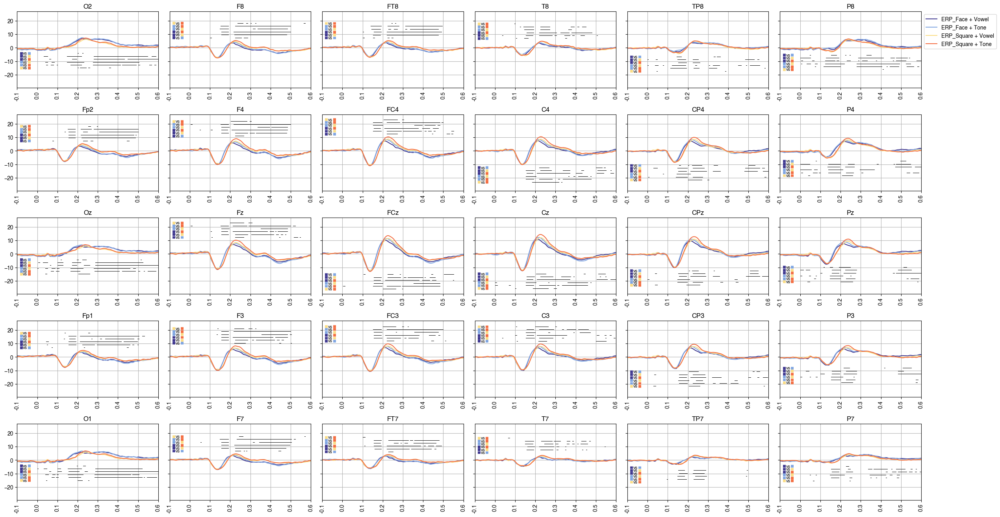

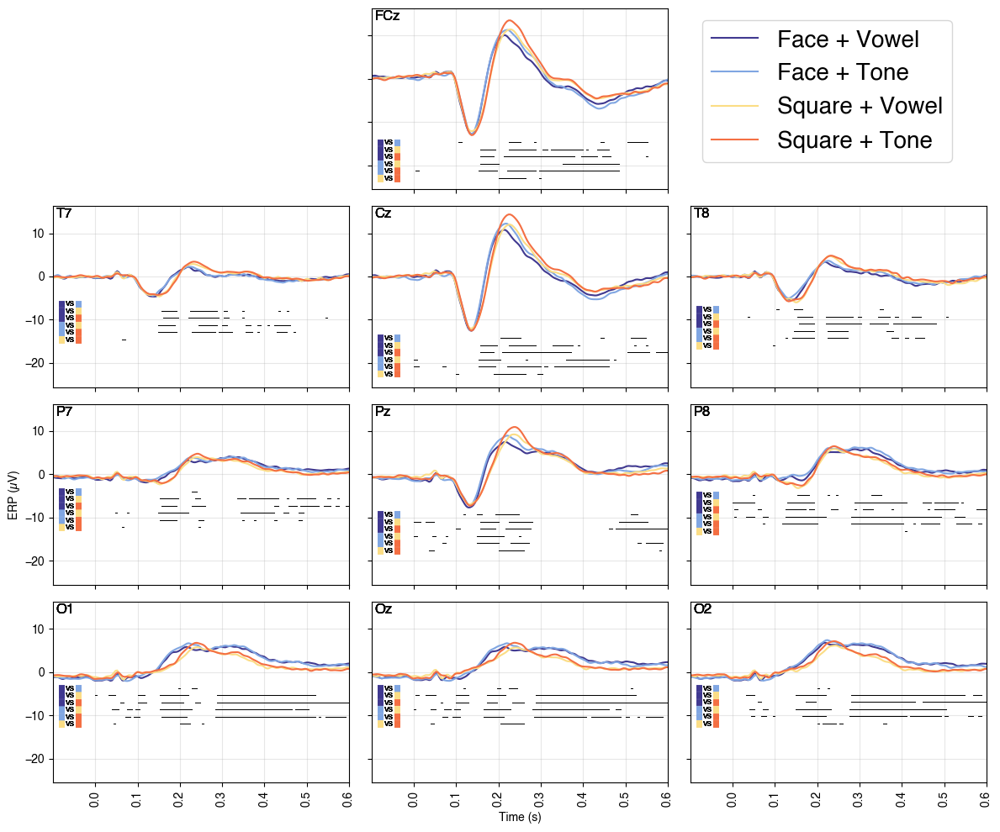

In [8]:
interval = [-1, 0.6]
fig, axes, erp1 = plotGrandERP(baseline = 1, interval = interval, triggers=filt_trigger([], [], ["stimuli_mix"], ["stimuli_square", "stimuli_music"]), label="Face + Vowel", color=myColors[0])
_, _, erp2 = plotGrandERP(baseline = 1, interval = interval, triggers=filt_trigger([], [], ["stimuli_mix"], ["stimuli_square", "stimuli_speech"]), fig=fig, axes=axes, label="Face + Tone", color=myColors[1])
_, _, erp3 = plotGrandERP(baseline = 1, interval = interval, triggers=filt_trigger([], [], ["stimuli_mix"], ["stimuli_face", "stimuli_music"]), fig=fig, axes=axes, label="Square + Vowel", color=myColors[2])
_, _, erp4 = plotGrandERP(baseline = 1, interval = interval, triggers=filt_trigger([], [], ["stimuli_mix"], ["stimuli_face", "stimuli_speech"]), fig=fig, axes=axes, label="Square + Tone", color=myColors[3])
_, _, pValues = plotSignificantIntervalOfERP([erp1, erp2, erp3, erp4], baseline = 1, fig=fig, axes=axes, test="wilcoxon", barHeight=2)
plot10ChannelERP(erps=[erp1, erp2, erp3, erp4], baseline=1, interval=interval, pValues=pValues, colors=[line.get_color() for line in axes[0, 0].get_lines()], labels=["Face + Vowel", "Face + Tone", "Square + Vowel", "Square + Tone"], barHeight=1.5)
# plt.show()
plt.savefig("speech_a_i_o.png", dpi=300, bbox_inches="tight")  # 保存為高解析度的 PNG
plt.show()

stimuli onset ERP: face V.S. square V.S. auditory V.S. mixture

100%|██████████| 26/26 [00:09<00:00,  2.82it/s]


trigger: ['stimuli_21', 'stimuli_22'], trials: 46


100%|██████████| 26/26 [00:08<00:00,  2.90it/s]


trigger: ['stimuli_23'], trials: 46


100%|██████████| 26/26 [00:09<00:00,  2.83it/s]


trigger: ['stimuli_26', 'stimuli_27', 'stimuli_25', 'stimuli_29', 'stimuli_28', 'stimuli_24'], trials: 46


100%|██████████| 26/26 [00:10<00:00,  2.60it/s]


trigger: ['stimuli_41', 'stimuli_47', 'stimuli_44', 'stimuli_43', 'stimuli_31', 'stimuli_35', 'stimuli_37', 'stimuli_30', 'stimuli_32', 'stimuli_45', 'stimuli_40', 'stimuli_39', 'stimuli_38', 'stimuli_42', 'stimuli_46', 'stimuli_36', 'stimuli_33', 'stimuli_34'], trials: 46
Exists statistical significance: True


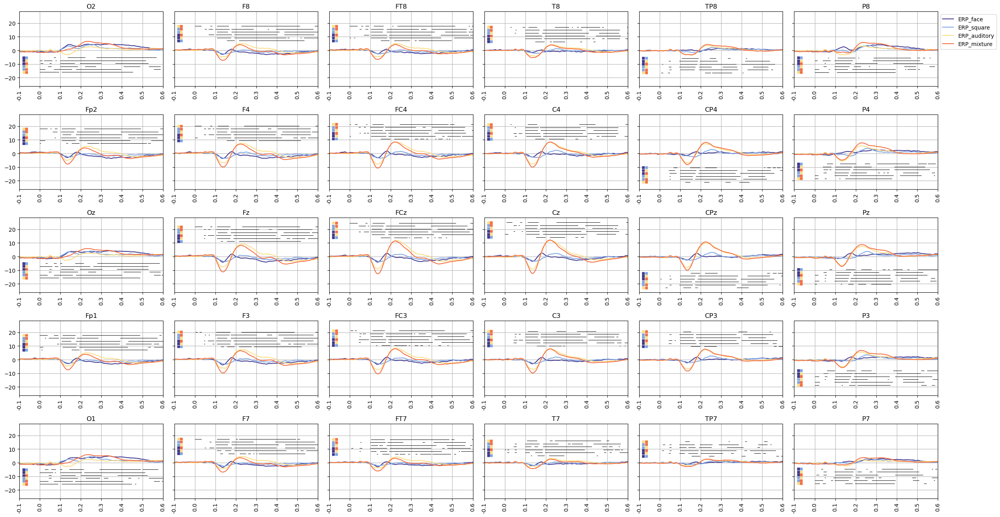

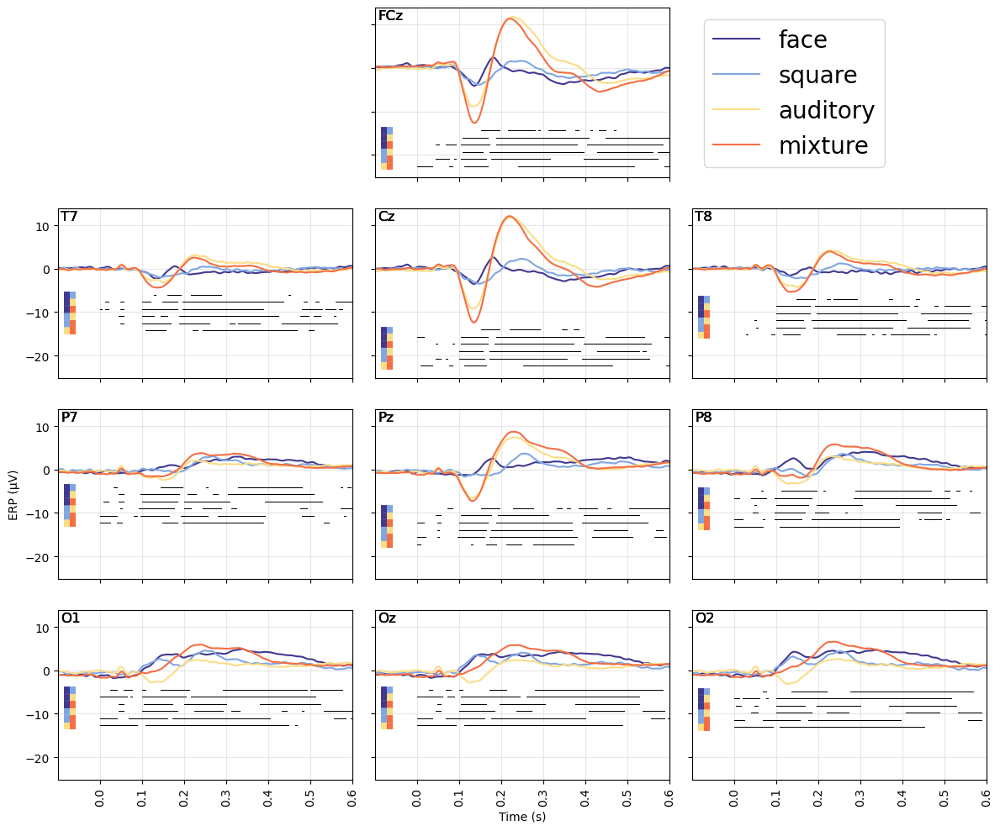

In [136]:
interval = [-1, 0.6]
fig, axes, erp1 = plotGrandERP(baseline = 1, interval = interval, triggers=filt_trigger(["stimuli_21", "stimuli_22"], [], [], []), label="face", color=myColors[0])
_, _, erp2 = plotGrandERP(baseline = 1, interval = interval, triggers=filt_trigger(["stimuli_23"], [], [], []), fig=fig, axes=axes, label="square", color=myColors[1])
_, _, erp3 = plotGrandERP(baseline = 1, interval = interval, triggers=filt_trigger([], [], ["stimuli_auditory"], ["stimuli_mix"]), fig=fig, axes=axes, label="auditory", color=myColors[2], eventAdjust={'27': 0.016})
_, _, erp4 = plotGrandERP(baseline = 1, interval = interval, triggers=filt_trigger([], [], ["stimuli_mix"], []), fig=fig, axes=axes, label="mixture", color=myColors[3])
_, _, pValues = plotSignificantIntervalOfERP([erp1, erp2, erp3, erp4], baseline = 1, fig=fig, axes=axes, test="wilcoxon", barHeight=2)
plot10ChannelERP(erps=[erp1, erp2, erp3, erp4], baseline=1, interval=interval, pValues=pValues, colors=[line.get_color() for line in axes[0, 0].get_lines()], labels=["face", "square", "auditory", "mixture"], barHeight=1.5)
plt.show()

Imagery onset ERP

100%|██████████| 26/26 [00:18<00:00,  1.44it/s]


trigger: ['imagery_23', 'imagery_22', 'imagery_21'], trials: 46


100%|██████████| 26/26 [00:17<00:00,  1.50it/s]


trigger: ['imagery_26', 'imagery_29', 'imagery_27', 'imagery_24', 'imagery_28', 'imagery_25'], trials: 46


100%|██████████| 26/26 [00:17<00:00,  1.46it/s]


trigger: ['imagery_30', 'imagery_33', 'imagery_42', 'imagery_35', 'imagery_44', 'imagery_46', 'imagery_37', 'imagery_31', 'imagery_38', 'imagery_40', 'imagery_36', 'imagery_39', 'imagery_34', 'imagery_43', 'imagery_45', 'imagery_47', 'imagery_41', 'imagery_32'], trials: 46


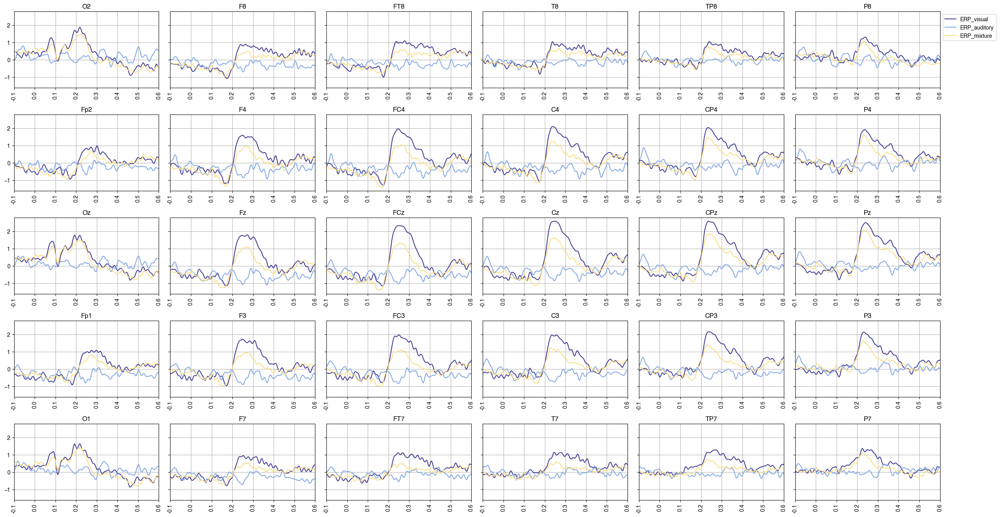

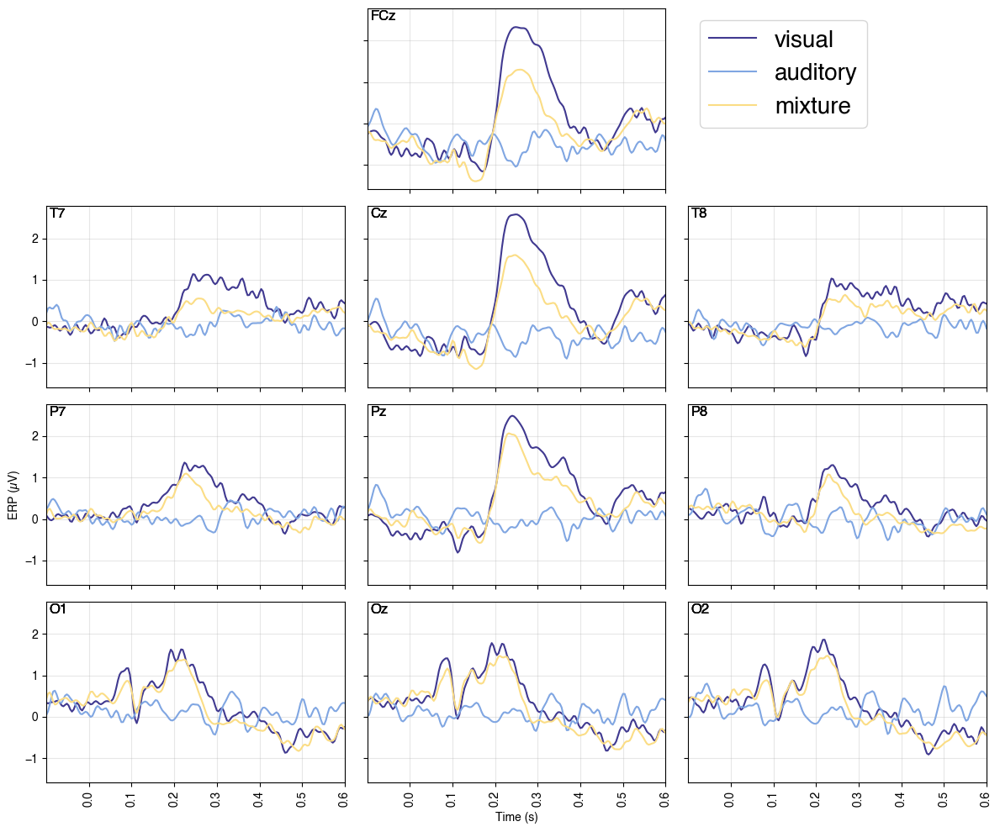

In [8]:
interval = [-1, 0.6]
fig, axes, erp1 = plotGrandERP(baseline = 1, interval = interval, triggers=filt_trigger([], [], ["imagery_visual"], ["imagery_mix"]), label="visual", color=myColors[0], eventOffset=1)
_, _, erp2 = plotGrandERP(baseline = 1, interval = interval, triggers=filt_trigger([], [], ["imagery_auditory"], ["imagery_mix"]), fig=fig, axes=axes, label="auditory", color=myColors[1], eventAdjust={'27': 0.016}, eventOffset=1)
_, _, erp3 = plotGrandERP(baseline = 1, interval = interval, triggers=filt_trigger([], [], ["imagery_mix"], []), fig=fig, axes=axes, label="mixture", color=myColors[2], eventOffset=1)
plot10ChannelERP(erps=[erp1, erp2, erp3], baseline=1, interval=interval, pValues=None, colors=[line.get_color() for line in axes[0, 0].get_lines()], labels=["visual", "auditory", "mixture"], barHeight=1.5)
plt.savefig("vam.png", dpi=300, bbox_inches="tight")  # 保存為高解析度的 PNG
plt.show()

Plot PSD difference topo accross subjects

100%|██████████| 26/26 [00:02<00:00, 11.80it/s]


Grand PSD difference ['imagery_21'] - ['imagery_21']


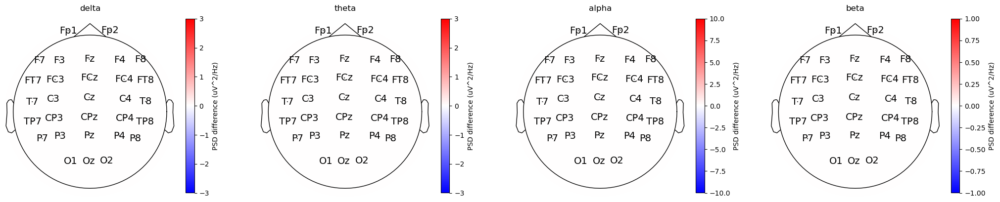

In [6]:

# plotGrandDeltaPSD(filt_trigger(["imagery_21"], [], [], []), "task_epoch", "imagery", 
#                   filt_trigger(["imagery_21"], [], [], []), "task_epoch", "imagery", test=None, testAlpha=0.05)

Plot PSD difference topo accross subjects (imagery - fixation)

In [13]:
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import pickle
from tqdm import tqdm
from concurrent.futures import ProcessPoolExecutor
from plot_PSD import calculate_band_powers, topo_PSD, get_cmap
from config import filt_trigger, channel_plot_order, channel_order

def getPSD(subjectId, sessions, triggers, epochDir, section):
    """Load and calculate PSD for a single subject."""
    PSD = np.zeros((0, 4, 30))
    for session in sessions:
        root = Path(f"../../dataset_noAvgRef_ASR_ICA/S{subjectId:03d}/session_{session}/{epochDir}")
        print(f"Checking path: {root}")
        if not root.exists():
            print(f"Path does not exist: {root}")
            continue

        for filePath in root.rglob(f"*{section}*.pickle"):
            print(f"Loading file: {filePath}")
            try:
                with open(filePath, "rb") as f:
                    newTrial = pickle.load(f)
                    if "trigger" not in newTrial or "data" not in newTrial:
                        print(f"Invalid file structure in {filePath}")
                        continue
                    if f"{section}_{newTrial['trigger']}" in triggers:
                        PSD = np.vstack((PSD, [calculate_band_powers(newTrial["data"][:, 250:], method="welch")]))
            except Exception as e:
                print(f"Error loading file {filePath}: {e}")

    if PSD.shape[0] == 0:
        print(f"No PSD data found for Subject {subjectId}, Sessions {sessions}")
        return None

    PSD = PSD.mean(axis=0, keepdims=True)
    return PSD

def process_subject(subjectId, sessions, trigger, epochDir, section):
    """Process PSD for a single subject in parallel."""
    PSDs = np.zeros((0, 4, 30))
    for session in sessions:
        PSD = getPSD(subjectId, session, trigger, epochDir, section)
        if PSD is not None:
            PSDs = np.concatenate([PSDs, PSD.mean(axis=0, keepdims=True)])
    return PSDs

def plotGrandPSD(trigger, epochDir, section):
    """Calculate and plot the grand average PSD for all subjects."""
    PSDs = np.zeros((0, 4, 30))
    with ProcessPoolExecutor() as executor:
        results = executor.map(process_subject, range(1, 27), [[1], [2]], [trigger] * 26, [epochDir] * 26, [section] * 26)
        for result in tqdm(results, desc="Processing Subjects"):
            if result is not None:
                PSDs = np.concatenate([PSDs, result])

    if PSDs.shape[0] == 0:
        print("No valid PSD data available for visualization.")
        return

    PSDs = PSDs.mean(0)
    vlims = [[0, np.abs(bandPSD).max()] for bandPSD in PSDs]
    cmaps = [get_cmap([vlim[0], vlim[1]], ["white", "red"]) for vlim in vlims]

    fig, axes = plt.subplots(ncols=4, figsize=(25.5, 8))
    print(f"Grand PSD {trigger}")
    band_names = ["Delta", "Theta", "Alpha", "Beta"]

    for bandId, (bandName, vlim, cmap) in enumerate(zip(band_names, vlims, cmaps)):
        axes[bandId].set_title(bandName)
        topo_PSD(PSDs[bandId], axes[bandId], vlim, cmap)

    for colId in range(4):
        fig.colorbar(axes[colId].images[-1], ax=axes[colId], location='right', 
                     shrink=0.7, pad=0.05, aspect=20, label='PSD (uV^2/Hz)')

    plt.tight_layout()
    plt.show()

def plotGrandDeltaPSD(trigger1, epochDir1, section1, trigger2, epochDir2, section2, vlims=None, test=None, testAlpha=0.05):
    """Calculate and plot the difference in PSD between two conditions."""
    deltaPSD = np.zeros((0, 4, 30))
    for subjectId in tqdm(range(1, 27), desc="Processing Subjects"):
        PSD1 = getPSD(subjectId, [[1], [2]], trigger1, epochDir1, section1)
        PSD2 = getPSD(subjectId, [[1], [2]], trigger2, epochDir2, section2)
        if PSD1 is None or PSD2 is None:
            continue
        deltaPSD = np.concatenate([deltaPSD, PSD1 - PSD2])

    if deltaPSD.shape[0] == 0:
        print("No valid delta PSD data available for visualization.")
        return

    deltaPSD = deltaPSD.mean(0)
    if vlims is None:
        vlims = [[-np.abs(bandDeltaPSD).max(), np.abs(bandDeltaPSD).max()] for bandDeltaPSD in deltaPSD]
    cmaps = [get_cmap([vlim[0], 0, vlim[1]], ["blue", "white", "red"]) for vlim in vlims]

    fig, axes = plt.subplots(nrows=4, figsize=(8, 16))
    band_names = ["Delta", "Theta", "Alpha", "Beta"]

    for bandId, (bandName, vlim, cmap) in enumerate(zip(band_names, vlims, cmaps)):
        axes[bandId].set_title(bandName)
        topo_PSD(deltaPSD[bandId], axes[bandId], vlim, cmap)

    for rowId in range(4):
        fig.colorbar(axes[rowId].images[-1], ax=axes[rowId], location='right', 
                     shrink=0.7, pad=0.05, aspect=20, label='PSD Difference (uV^2/Hz)')

    plt.tight_layout()
    plt.show()



In [14]:
myVlims = [[-3, 3], [-3, 3], [-25, 25], [-5, 5]]
plotGrandDeltaPSD(filt_trigger([], [], ["imagery_visual"], ["imagery_auditory"]), "task_epoch", "imagery", 
                  filt_trigger([], [], ["fixation_fixation"], []), "task_epoch", "fixation", test="wilcoxon", vlims=myVlims)
plotGrandDeltaPSD(filt_trigger([], [], ["imagery_auditory"], ["imagery_visual"]), "task_epoch", "imagery", 
                  filt_trigger([], [], ["fixation_fixation"], []), "task_epoch", "fixation", test="wilcoxon", vlims=myVlims)
plotGrandDeltaPSD(filt_trigger([], [], ["imagery_mix"], []), "task_epoch", "imagery", 
                  filt_trigger([], [], ["fixation_fixation"], []), "task_epoch", "fixation", test="wilcoxon", vlims=myVlims)
plotGrandDeltaPSD(filt_trigger([], [], ["imagery_visual", "imagery_auditory"], []), "task_epoch", "imagery", 
                  filt_trigger([], [], ["fixation_fixation"], []), "task_epoch", "fixation", test="wilcoxon", vlims=myVlims)
print()  # supresss return output

Processing Subjects: 100%|██████████| 26/26 [00:00<00:00, 810.86it/s]


Checking path: ../../dataset_noAvgRef_ASR_ICA/S001/session_[1]/task_epoch
Path does not exist: ../../dataset_noAvgRef_ASR_ICA/S001/session_[1]/task_epoch
Checking path: ../../dataset_noAvgRef_ASR_ICA/S001/session_[2]/task_epoch
Path does not exist: ../../dataset_noAvgRef_ASR_ICA/S001/session_[2]/task_epoch
No PSD data found for Subject 1, Sessions [[1], [2]]
Checking path: ../../dataset_noAvgRef_ASR_ICA/S001/session_[1]/task_epoch
Path does not exist: ../../dataset_noAvgRef_ASR_ICA/S001/session_[1]/task_epoch
Checking path: ../../dataset_noAvgRef_ASR_ICA/S001/session_[2]/task_epoch
Path does not exist: ../../dataset_noAvgRef_ASR_ICA/S001/session_[2]/task_epoch
No PSD data found for Subject 1, Sessions [[1], [2]]
Checking path: ../../dataset_noAvgRef_ASR_ICA/S002/session_[1]/task_epoch
Path does not exist: ../../dataset_noAvgRef_ASR_ICA/S002/session_[1]/task_epoch
Checking path: ../../dataset_noAvgRef_ASR_ICA/S002/session_[2]/task_epoch
Path does not exist: ../../dataset_noAvgRef_ASR_IC

Processing Subjects: 100%|██████████| 26/26 [00:00<00:00, 4890.22it/s]


Checking path: ../../dataset_noAvgRef_ASR_ICA/S001/session_[1]/task_epoch
Path does not exist: ../../dataset_noAvgRef_ASR_ICA/S001/session_[1]/task_epoch
Checking path: ../../dataset_noAvgRef_ASR_ICA/S001/session_[2]/task_epoch
Path does not exist: ../../dataset_noAvgRef_ASR_ICA/S001/session_[2]/task_epoch
No PSD data found for Subject 1, Sessions [[1], [2]]
Checking path: ../../dataset_noAvgRef_ASR_ICA/S001/session_[1]/task_epoch
Path does not exist: ../../dataset_noAvgRef_ASR_ICA/S001/session_[1]/task_epoch
Checking path: ../../dataset_noAvgRef_ASR_ICA/S001/session_[2]/task_epoch
Path does not exist: ../../dataset_noAvgRef_ASR_ICA/S001/session_[2]/task_epoch
No PSD data found for Subject 1, Sessions [[1], [2]]
Checking path: ../../dataset_noAvgRef_ASR_ICA/S002/session_[1]/task_epoch
Path does not exist: ../../dataset_noAvgRef_ASR_ICA/S002/session_[1]/task_epoch
Checking path: ../../dataset_noAvgRef_ASR_ICA/S002/session_[2]/task_epoch
Path does not exist: ../../dataset_noAvgRef_ASR_IC

Processing Subjects: 100%|██████████| 26/26 [00:00<00:00, 1663.57it/s]


Checking path: ../../dataset_noAvgRef_ASR_ICA/S001/session_[1]/task_epoch
Path does not exist: ../../dataset_noAvgRef_ASR_ICA/S001/session_[1]/task_epoch
Checking path: ../../dataset_noAvgRef_ASR_ICA/S001/session_[2]/task_epoch
Path does not exist: ../../dataset_noAvgRef_ASR_ICA/S001/session_[2]/task_epoch
No PSD data found for Subject 1, Sessions [[1], [2]]
Checking path: ../../dataset_noAvgRef_ASR_ICA/S001/session_[1]/task_epoch
Path does not exist: ../../dataset_noAvgRef_ASR_ICA/S001/session_[1]/task_epoch
Checking path: ../../dataset_noAvgRef_ASR_ICA/S001/session_[2]/task_epoch
Path does not exist: ../../dataset_noAvgRef_ASR_ICA/S001/session_[2]/task_epoch
No PSD data found for Subject 1, Sessions [[1], [2]]
Checking path: ../../dataset_noAvgRef_ASR_ICA/S002/session_[1]/task_epoch
Path does not exist: ../../dataset_noAvgRef_ASR_ICA/S002/session_[1]/task_epoch
Checking path: ../../dataset_noAvgRef_ASR_ICA/S002/session_[2]/task_epoch
Path does not exist: ../../dataset_noAvgRef_ASR_IC

Processing Subjects: 100%|██████████| 26/26 [00:00<00:00, 2068.43it/s]

Checking path: ../../dataset_noAvgRef_ASR_ICA/S001/session_[1]/task_epoch
Path does not exist: ../../dataset_noAvgRef_ASR_ICA/S001/session_[1]/task_epoch
Checking path: ../../dataset_noAvgRef_ASR_ICA/S001/session_[2]/task_epoch
Path does not exist: ../../dataset_noAvgRef_ASR_ICA/S001/session_[2]/task_epoch
No PSD data found for Subject 1, Sessions [[1], [2]]
Checking path: ../../dataset_noAvgRef_ASR_ICA/S001/session_[1]/task_epoch
Path does not exist: ../../dataset_noAvgRef_ASR_ICA/S001/session_[1]/task_epoch
Checking path: ../../dataset_noAvgRef_ASR_ICA/S001/session_[2]/task_epoch
Path does not exist: ../../dataset_noAvgRef_ASR_ICA/S001/session_[2]/task_epoch
No PSD data found for Subject 1, Sessions [[1], [2]]
Checking path: ../../dataset_noAvgRef_ASR_ICA/S002/session_[1]/task_epoch
Path does not exist: ../../dataset_noAvgRef_ASR_ICA/S002/session_[1]/task_epoch
Checking path: ../../dataset_noAvgRef_ASR_ICA/S002/session_[2]/task_epoch
Path does not exist: ../../dataset_noAvgRef_ASR_IC

Imagery type difference

In [3]:
myVlims = [[-0.8, 0.8], [-1, 1], [-12, 12], [-2.3, 2.3]]
plotGrandDeltaPSD(filt_trigger([], [], ["imagery_visual"], ["imagery_auditory"]), "task_epoch", "imagery", 
                  filt_trigger([], [], ["imagery_auditory"], ["imagery_visual"]), "task_epoch", "imagery", test="wilcoxon", vlims=myVlims)
plotGrandDeltaPSD(filt_trigger([], [], ["imagery_mix"], []), "task_epoch", "imagery", 
                  filt_trigger([], [], ["imagery_visual"], ["imagery_auditory"]), "task_epoch", "imagery", test="wilcoxon", vlims=myVlims)
plotGrandDeltaPSD(filt_trigger([], [], ["imagery_mix"], []), "task_epoch", "imagery", 
                  filt_trigger([], [], ["imagery_auditory"], ["imagery_visual"]), "task_epoch", "imagery", test="wilcoxon", vlims=myVlims)
print()  # supresss return output

Processing Subjects: 100%|██████████| 26/26 [00:00<00:00, 3504.46it/s]


Checking path: ../../dataset_noAvgRef_ASR_ICA/S001/session_[1]/task_epoch
Path does not exist: ../../dataset_noAvgRef_ASR_ICA/S001/session_[1]/task_epoch
Checking path: ../../dataset_noAvgRef_ASR_ICA/S001/session_[2]/task_epoch
Path does not exist: ../../dataset_noAvgRef_ASR_ICA/S001/session_[2]/task_epoch
No PSD data found for Subject 1, Sessions [[1], [2]]
Checking path: ../../dataset_noAvgRef_ASR_ICA/S001/session_[1]/task_epoch
Path does not exist: ../../dataset_noAvgRef_ASR_ICA/S001/session_[1]/task_epoch
Checking path: ../../dataset_noAvgRef_ASR_ICA/S001/session_[2]/task_epoch
Path does not exist: ../../dataset_noAvgRef_ASR_ICA/S001/session_[2]/task_epoch
No PSD data found for Subject 1, Sessions [[1], [2]]
Checking path: ../../dataset_noAvgRef_ASR_ICA/S002/session_[1]/task_epoch
Path does not exist: ../../dataset_noAvgRef_ASR_ICA/S002/session_[1]/task_epoch
Checking path: ../../dataset_noAvgRef_ASR_ICA/S002/session_[2]/task_epoch
Path does not exist: ../../dataset_noAvgRef_ASR_IC

Processing Subjects: 100%|██████████| 26/26 [00:00<00:00, 2179.95it/s]


Checking path: ../../dataset_noAvgRef_ASR_ICA/S001/session_[1]/task_epoch
Path does not exist: ../../dataset_noAvgRef_ASR_ICA/S001/session_[1]/task_epoch
Checking path: ../../dataset_noAvgRef_ASR_ICA/S001/session_[2]/task_epoch
Path does not exist: ../../dataset_noAvgRef_ASR_ICA/S001/session_[2]/task_epoch
No PSD data found for Subject 1, Sessions [[1], [2]]
Checking path: ../../dataset_noAvgRef_ASR_ICA/S001/session_[1]/task_epoch
Path does not exist: ../../dataset_noAvgRef_ASR_ICA/S001/session_[1]/task_epoch
Checking path: ../../dataset_noAvgRef_ASR_ICA/S001/session_[2]/task_epoch
Path does not exist: ../../dataset_noAvgRef_ASR_ICA/S001/session_[2]/task_epoch
No PSD data found for Subject 1, Sessions [[1], [2]]
Checking path: ../../dataset_noAvgRef_ASR_ICA/S002/session_[1]/task_epoch
Path does not exist: ../../dataset_noAvgRef_ASR_ICA/S002/session_[1]/task_epoch
Checking path: ../../dataset_noAvgRef_ASR_ICA/S002/session_[2]/task_epoch
Path does not exist: ../../dataset_noAvgRef_ASR_IC

Processing Subjects: 100%|██████████| 26/26 [00:00<00:00, 3415.66it/s]

Checking path: ../../dataset_noAvgRef_ASR_ICA/S001/session_[1]/task_epoch
Path does not exist: ../../dataset_noAvgRef_ASR_ICA/S001/session_[1]/task_epoch
Checking path: ../../dataset_noAvgRef_ASR_ICA/S001/session_[2]/task_epoch
Path does not exist: ../../dataset_noAvgRef_ASR_ICA/S001/session_[2]/task_epoch
No PSD data found for Subject 1, Sessions [[1], [2]]
Checking path: ../../dataset_noAvgRef_ASR_ICA/S001/session_[1]/task_epoch
Path does not exist: ../../dataset_noAvgRef_ASR_ICA/S001/session_[1]/task_epoch
Checking path: ../../dataset_noAvgRef_ASR_ICA/S001/session_[2]/task_epoch
Path does not exist: ../../dataset_noAvgRef_ASR_ICA/S001/session_[2]/task_epoch
No PSD data found for Subject 1, Sessions [[1], [2]]
Checking path: ../../dataset_noAvgRef_ASR_ICA/S002/session_[1]/task_epoch
Path does not exist: ../../dataset_noAvgRef_ASR_ICA/S002/session_[1]/task_epoch
Checking path: ../../dataset_noAvgRef_ASR_ICA/S002/session_[2]/task_epoch
Path does not exist: ../../dataset_noAvgRef_ASR_IC

Plot PSD difference topo accross subjects (fixation - resting)

In [4]:
plotGrandDeltaPSD(filt_trigger([], [], ["fixation_fixation"], []), "task_epoch", "fixation",
                  filt_trigger([], [], ["resting_open"], []), "resting_epoch", "resting", test="wilcoxon")
print()  # supresss return output

Processing Subjects: 100%|██████████| 26/26 [00:00<00:00, 2994.70it/s]

Checking path: ../../dataset_noAvgRef_ASR_ICA/S001/session_[1]/task_epoch
Path does not exist: ../../dataset_noAvgRef_ASR_ICA/S001/session_[1]/task_epoch
Checking path: ../../dataset_noAvgRef_ASR_ICA/S001/session_[2]/task_epoch
Path does not exist: ../../dataset_noAvgRef_ASR_ICA/S001/session_[2]/task_epoch
No PSD data found for Subject 1, Sessions [[1], [2]]
Checking path: ../../dataset_noAvgRef_ASR_ICA/S001/session_[1]/resting_epoch
Path does not exist: ../../dataset_noAvgRef_ASR_ICA/S001/session_[1]/resting_epoch
Checking path: ../../dataset_noAvgRef_ASR_ICA/S001/session_[2]/resting_epoch
Path does not exist: ../../dataset_noAvgRef_ASR_ICA/S001/session_[2]/resting_epoch
No PSD data found for Subject 1, Sessions [[1], [2]]
Checking path: ../../dataset_noAvgRef_ASR_ICA/S002/session_[1]/task_epoch
Path does not exist: ../../dataset_noAvgRef_ASR_ICA/S002/session_[1]/task_epoch
Checking path: ../../dataset_noAvgRef_ASR_ICA/S002/session_[2]/task_epoch
Path does not exist: ../../dataset_noA

Plot PSD difference topo accross subjects (imagery - resting)

In [6]:
plotGrandDeltaPSD(filt_trigger([], [], ["imagery_visual"], ["imagery_auditory"]), "task_epoch", "imagery", 
                  filt_trigger([], [], ["resting_open"], []), "resting_epoch", "resting", test="wilcoxon")
plotGrandDeltaPSD(filt_trigger([], [], ["imagery_auditory"], ["imagery_visual"]), "task_epoch", "imagery", 
                  filt_trigger([], [], ["resting_open"], []), "resting_epoch", "resting", test="wilcoxon")
plotGrandDeltaPSD(filt_trigger([], [], ["imagery_mix"], []), "task_epoch", "imagery", 
                  filt_trigger([], [], ["resting_open"], []), "resting_epoch", "resting", test="wilcoxon")
plotGrandDeltaPSD(filt_trigger([], [], ["imagery_visual", "imagery_auditory"], []), "task_epoch", "imagery", 
                  filt_trigger([], [], ["resting_open"], []), "resting_epoch", "resting", test="wilcoxon")
print()  # supresss return output

Processing Subjects: 100%|██████████| 26/26 [00:00<00:00, 2095.58it/s]


Checking path: ../../dataset_noAvgRef_ASR_ICA/S001/session_[1]/task_epoch
Path does not exist: ../../dataset_noAvgRef_ASR_ICA/S001/session_[1]/task_epoch
Checking path: ../../dataset_noAvgRef_ASR_ICA/S001/session_[2]/task_epoch
Path does not exist: ../../dataset_noAvgRef_ASR_ICA/S001/session_[2]/task_epoch
No PSD data found for Subject 1, Sessions [[1], [2]]
Checking path: ../../dataset_noAvgRef_ASR_ICA/S001/session_[1]/resting_epoch
Path does not exist: ../../dataset_noAvgRef_ASR_ICA/S001/session_[1]/resting_epoch
Checking path: ../../dataset_noAvgRef_ASR_ICA/S001/session_[2]/resting_epoch
Path does not exist: ../../dataset_noAvgRef_ASR_ICA/S001/session_[2]/resting_epoch
No PSD data found for Subject 1, Sessions [[1], [2]]
Checking path: ../../dataset_noAvgRef_ASR_ICA/S002/session_[1]/task_epoch
Path does not exist: ../../dataset_noAvgRef_ASR_ICA/S002/session_[1]/task_epoch
Checking path: ../../dataset_noAvgRef_ASR_ICA/S002/session_[2]/task_epoch
Path does not exist: ../../dataset_noA

Processing Subjects: 100%|██████████| 26/26 [00:00<00:00, 3785.74it/s]


Checking path: ../../dataset_noAvgRef_ASR_ICA/S001/session_[1]/task_epoch
Path does not exist: ../../dataset_noAvgRef_ASR_ICA/S001/session_[1]/task_epoch
Checking path: ../../dataset_noAvgRef_ASR_ICA/S001/session_[2]/task_epoch
Path does not exist: ../../dataset_noAvgRef_ASR_ICA/S001/session_[2]/task_epoch
No PSD data found for Subject 1, Sessions [[1], [2]]
Checking path: ../../dataset_noAvgRef_ASR_ICA/S001/session_[1]/resting_epoch
Path does not exist: ../../dataset_noAvgRef_ASR_ICA/S001/session_[1]/resting_epoch
Checking path: ../../dataset_noAvgRef_ASR_ICA/S001/session_[2]/resting_epoch
Path does not exist: ../../dataset_noAvgRef_ASR_ICA/S001/session_[2]/resting_epoch
No PSD data found for Subject 1, Sessions [[1], [2]]
Checking path: ../../dataset_noAvgRef_ASR_ICA/S002/session_[1]/task_epoch
Path does not exist: ../../dataset_noAvgRef_ASR_ICA/S002/session_[1]/task_epoch
Checking path: ../../dataset_noAvgRef_ASR_ICA/S002/session_[2]/task_epoch
Path does not exist: ../../dataset_noA

Processing Subjects: 100%|██████████| 26/26 [00:00<00:00, 3942.87it/s]


Checking path: ../../dataset_noAvgRef_ASR_ICA/S001/session_[1]/task_epoch
Path does not exist: ../../dataset_noAvgRef_ASR_ICA/S001/session_[1]/task_epoch
Checking path: ../../dataset_noAvgRef_ASR_ICA/S001/session_[2]/task_epoch
Path does not exist: ../../dataset_noAvgRef_ASR_ICA/S001/session_[2]/task_epoch
No PSD data found for Subject 1, Sessions [[1], [2]]
Checking path: ../../dataset_noAvgRef_ASR_ICA/S001/session_[1]/resting_epoch
Path does not exist: ../../dataset_noAvgRef_ASR_ICA/S001/session_[1]/resting_epoch
Checking path: ../../dataset_noAvgRef_ASR_ICA/S001/session_[2]/resting_epoch
Path does not exist: ../../dataset_noAvgRef_ASR_ICA/S001/session_[2]/resting_epoch
No PSD data found for Subject 1, Sessions [[1], [2]]
Checking path: ../../dataset_noAvgRef_ASR_ICA/S002/session_[1]/task_epoch
Path does not exist: ../../dataset_noAvgRef_ASR_ICA/S002/session_[1]/task_epoch
Checking path: ../../dataset_noAvgRef_ASR_ICA/S002/session_[2]/task_epoch
Path does not exist: ../../dataset_noA

Processing Subjects: 100%|██████████| 26/26 [00:00<00:00, 2657.73it/s]

Checking path: ../../dataset_noAvgRef_ASR_ICA/S001/session_[1]/task_epoch
Path does not exist: ../../dataset_noAvgRef_ASR_ICA/S001/session_[1]/task_epoch
Checking path: ../../dataset_noAvgRef_ASR_ICA/S001/session_[2]/task_epoch
Path does not exist: ../../dataset_noAvgRef_ASR_ICA/S001/session_[2]/task_epoch
No PSD data found for Subject 1, Sessions [[1], [2]]
Checking path: ../../dataset_noAvgRef_ASR_ICA/S001/session_[1]/resting_epoch
Path does not exist: ../../dataset_noAvgRef_ASR_ICA/S001/session_[1]/resting_epoch
Checking path: ../../dataset_noAvgRef_ASR_ICA/S001/session_[2]/resting_epoch
Path does not exist: ../../dataset_noAvgRef_ASR_ICA/S001/session_[2]/resting_epoch
No PSD data found for Subject 1, Sessions [[1], [2]]
Checking path: ../../dataset_noAvgRef_ASR_ICA/S002/session_[1]/task_epoch
Path does not exist: ../../dataset_noAvgRef_ASR_ICA/S002/session_[1]/task_epoch
Checking path: ../../dataset_noAvgRef_ASR_ICA/S002/session_[2]/task_epoch
Path does not exist: ../../dataset_noA

fixation PSD

 19%|█▉        | 5/26 [00:00<00:02,  9.30it/s]

Subject 4, session [2] has no data... skipped
Subject 5, session [2] has no data... skipped


 31%|███       | 8/26 [00:00<00:01,  9.88it/s]

Subject 7, session [2] has no data... skipped
Subject 8, session [2] has no data... skipped
Subject 9, session [2] has no data... skipped


 38%|███▊      | 10/26 [00:01<00:01, 10.88it/s]

Subject 10, session [2] has no data... skipped


100%|██████████| 26/26 [00:03<00:00,  7.54it/s]


Grand PSD ['fixation_6']


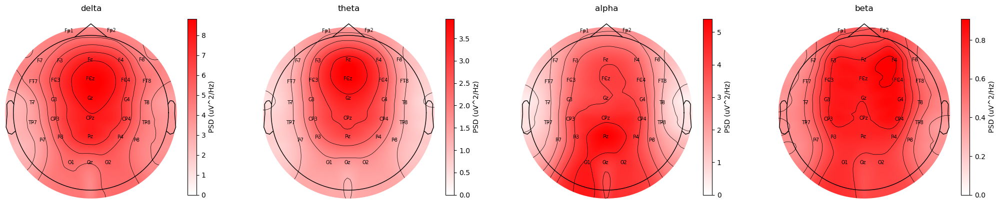

In [30]:
plotGrandPSD(filt_trigger([], [], ["fixation_fixation"], []), "task_epoch", "fixation")

Resting PSD

100%|██████████| 26/26 [00:00<00:00, 40.91it/s]


Grand PSD ['resting_5']


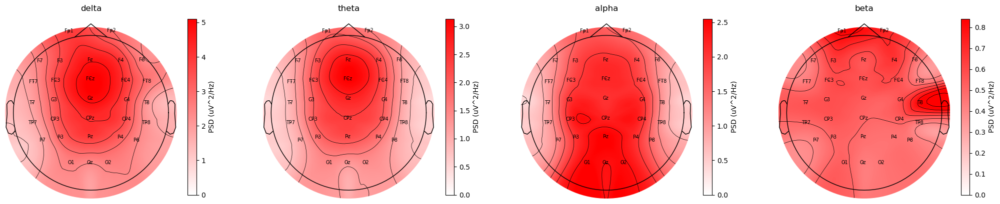

100%|██████████| 26/26 [00:00<00:00, 42.66it/s]


Grand PSD ['resting_3']


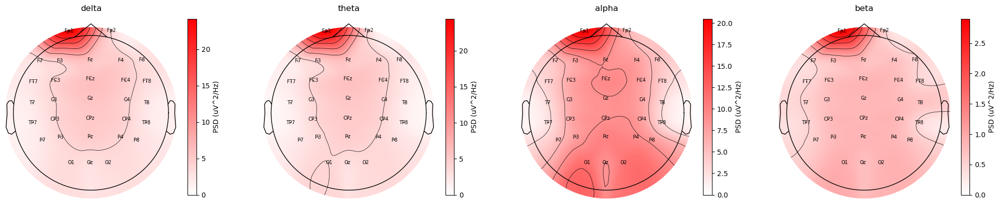

In [11]:
plotGrandPSD(filt_trigger([], [], ["resting_open"], []), "resting_epoch", "resting")
plotGrandPSD(filt_trigger([], [], ["resting_close"], []), "resting_epoch", "resting")
print()  # supresss return output

face V.S. non-face imagery

100%|██████████| 26/26 [00:06<00:00,  3.87it/s]


True
Grand PSD difference ['imagery_46', 'imagery_38', 'imagery_42', 'imagery_37', 'imagery_39', 'imagery_40', 'imagery_44', 'imagery_22', 'imagery_21', 'imagery_45', 'imagery_36', 'imagery_43', 'imagery_47', 'imagery_41'] - ['imagery_26', 'imagery_25', 'imagery_24', 'imagery_33', 'imagery_29', 'imagery_31', 'imagery_30', 'imagery_28', 'imagery_23', 'imagery_32', 'imagery_27', 'imagery_35', 'imagery_34']


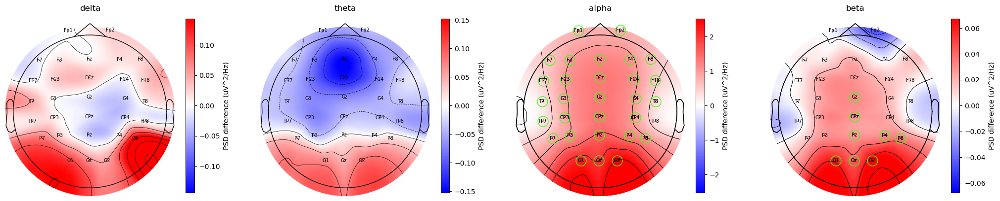

In [18]:
plotGrandDeltaPSD(filt_trigger([], [], ["imagery_face"], []), "task_epoch", "imagery",
                  filt_trigger([], [], ["imagery_auditory", "imagery_visual"], ["imagery_face"]), "task_epoch", "imagery", test="wilcoxon")
print()  # supresss return output


PSD - fixation (per trigger)

100%|██████████| 26/26 [00:04<00:00,  5.48it/s]


Grand PSD difference ['imagery_21'] - ['fixation_6']


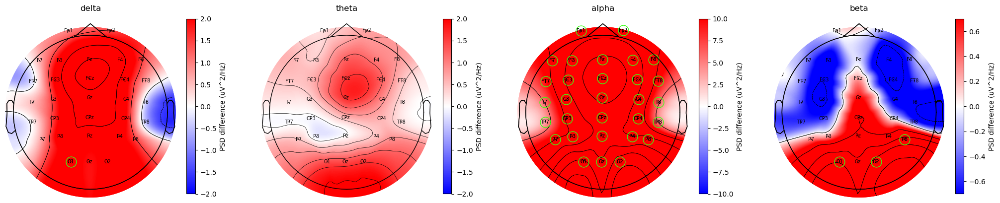

trigger: 21


100%|██████████| 26/26 [00:04<00:00,  5.39it/s]


Grand PSD difference ['imagery_22'] - ['fixation_6']


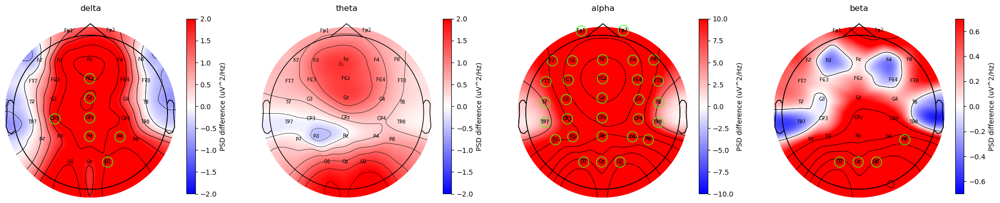

trigger: 22


100%|██████████| 26/26 [00:05<00:00,  5.12it/s]


Grand PSD difference ['imagery_23'] - ['fixation_6']


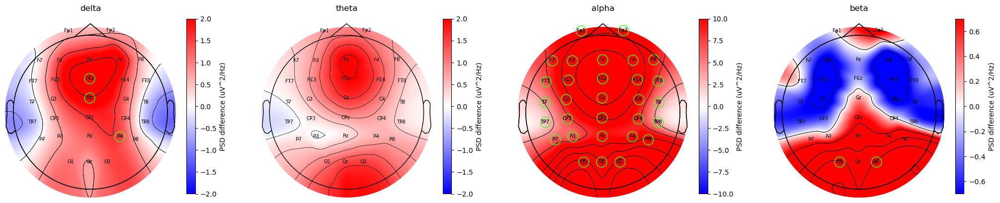

trigger: 23


100%|██████████| 26/26 [00:04<00:00,  5.60it/s]


Grand PSD difference ['imagery_24'] - ['fixation_6']


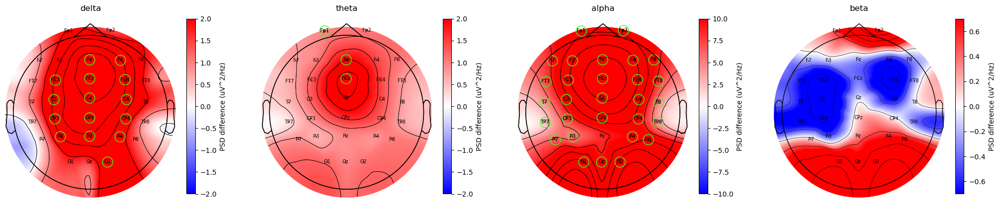

trigger: 24


100%|██████████| 26/26 [00:04<00:00,  5.60it/s]


Grand PSD difference ['imagery_25'] - ['fixation_6']


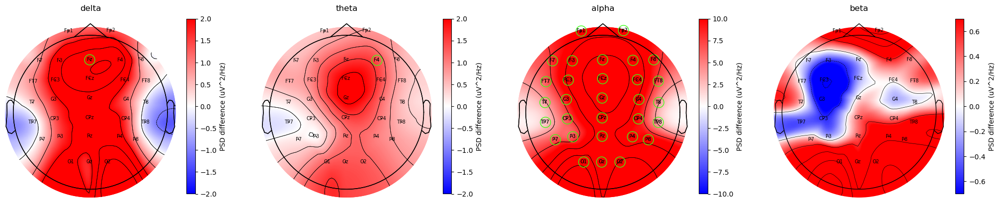

trigger: 25


100%|██████████| 26/26 [00:04<00:00,  5.58it/s]


Grand PSD difference ['imagery_26'] - ['fixation_6']


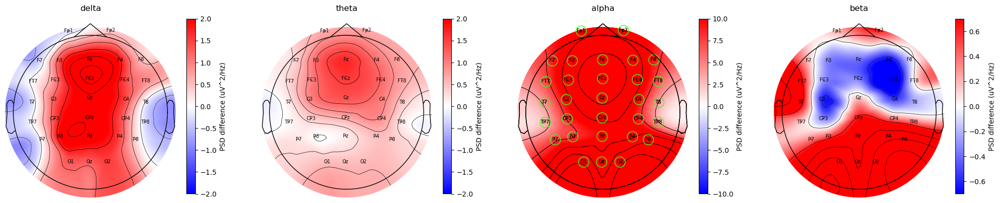

trigger: 26


100%|██████████| 26/26 [00:04<00:00,  5.63it/s]


Grand PSD difference ['imagery_27'] - ['fixation_6']


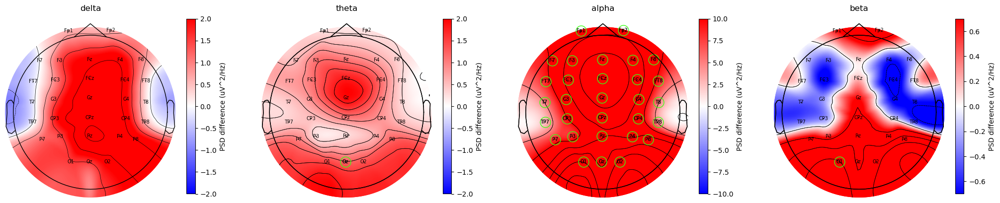

trigger: 27


100%|██████████| 26/26 [00:04<00:00,  5.58it/s]


Grand PSD difference ['imagery_28'] - ['fixation_6']


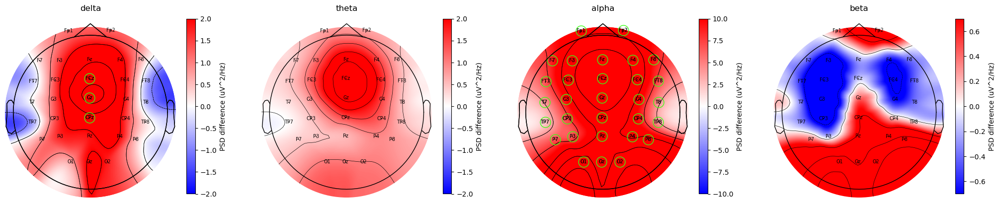

trigger: 28


100%|██████████| 26/26 [00:04<00:00,  5.70it/s]


Grand PSD difference ['imagery_29'] - ['fixation_6']


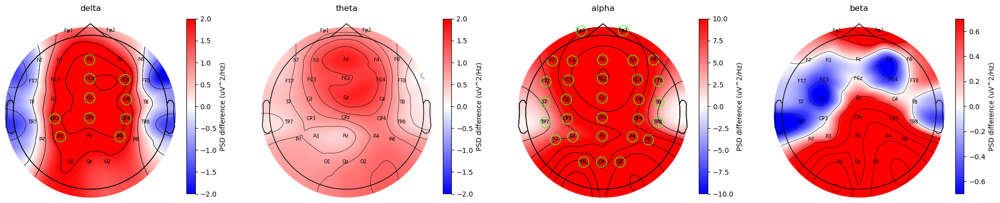

trigger: 29


100%|██████████| 26/26 [00:04<00:00,  5.63it/s]


Grand PSD difference ['imagery_30'] - ['fixation_6']


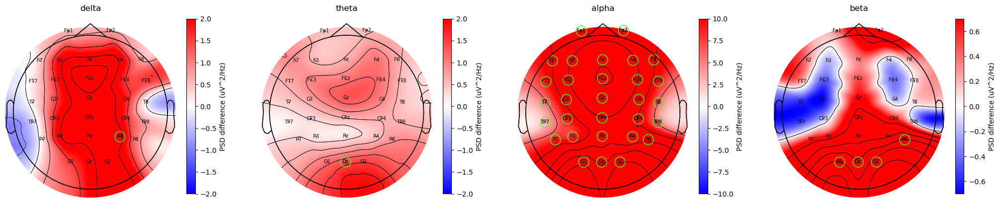

trigger: 30


100%|██████████| 26/26 [00:04<00:00,  5.66it/s]


Grand PSD difference ['imagery_31'] - ['fixation_6']


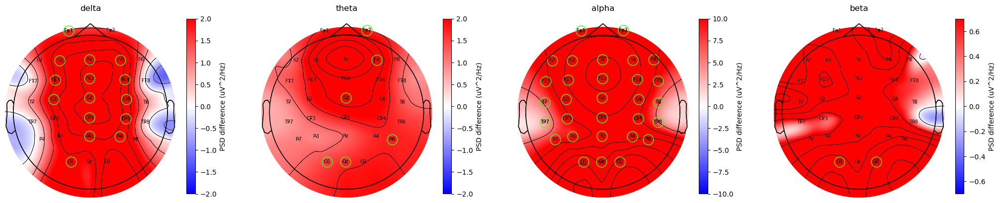

trigger: 31


100%|██████████| 26/26 [00:04<00:00,  5.64it/s]


Grand PSD difference ['imagery_32'] - ['fixation_6']


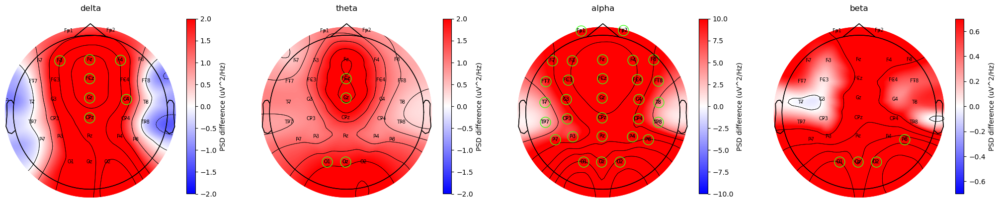

trigger: 32


100%|██████████| 26/26 [00:04<00:00,  5.62it/s]


Grand PSD difference ['imagery_33'] - ['fixation_6']


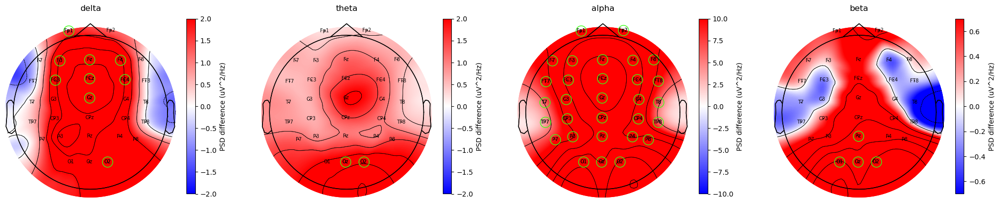

trigger: 33


100%|██████████| 26/26 [00:04<00:00,  5.65it/s]


Grand PSD difference ['imagery_34'] - ['fixation_6']


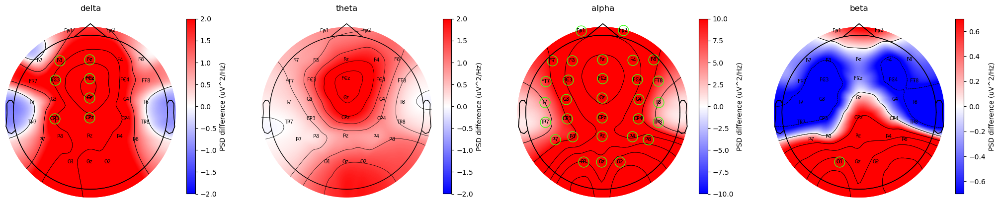

trigger: 34


100%|██████████| 26/26 [00:04<00:00,  5.66it/s]


Grand PSD difference ['imagery_35'] - ['fixation_6']


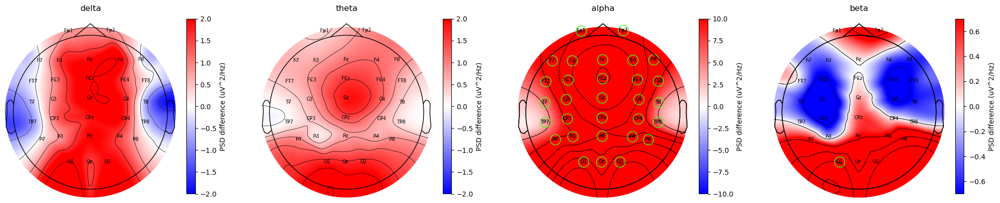

trigger: 35


100%|██████████| 26/26 [00:04<00:00,  5.77it/s]


Grand PSD difference ['imagery_36'] - ['fixation_6']


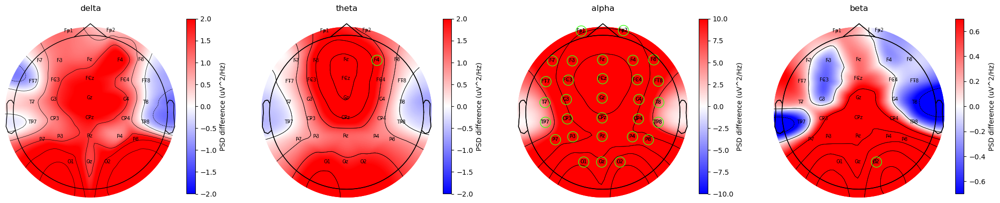

trigger: 36


100%|██████████| 26/26 [00:04<00:00,  5.76it/s]


Grand PSD difference ['imagery_37'] - ['fixation_6']


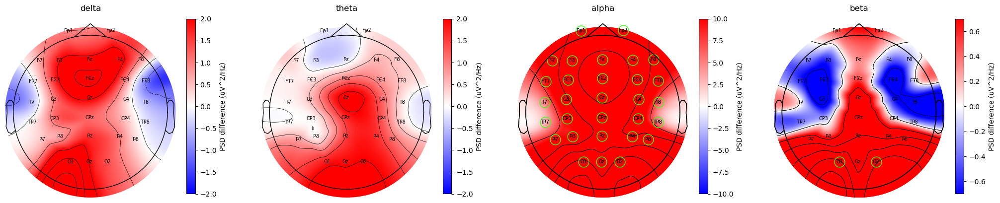

trigger: 37


100%|██████████| 26/26 [00:04<00:00,  5.79it/s]


Grand PSD difference ['imagery_38'] - ['fixation_6']


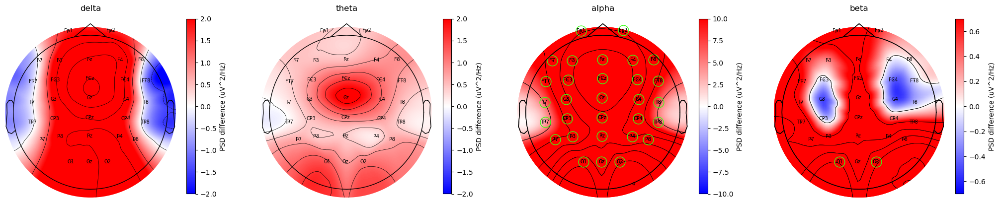

trigger: 38


100%|██████████| 26/26 [00:04<00:00,  5.75it/s]


Grand PSD difference ['imagery_39'] - ['fixation_6']


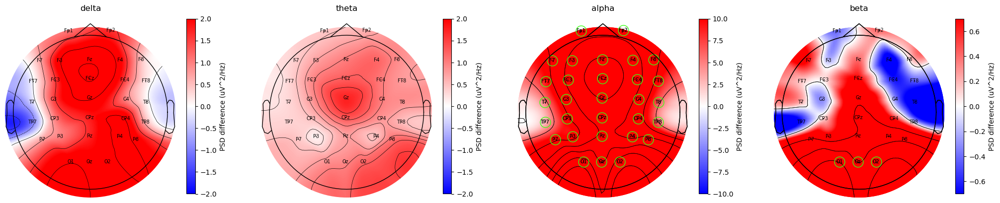

trigger: 39


100%|██████████| 26/26 [00:04<00:00,  5.77it/s]


Grand PSD difference ['imagery_40'] - ['fixation_6']


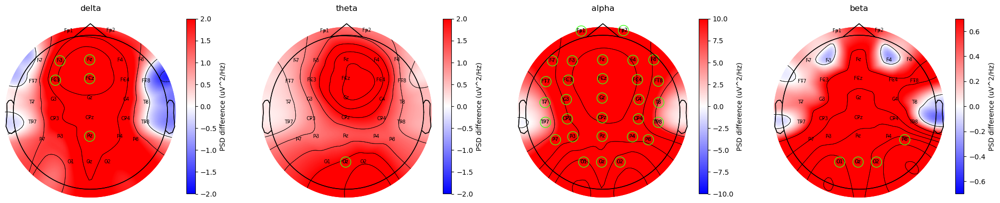

trigger: 40


100%|██████████| 26/26 [00:04<00:00,  5.76it/s]


Grand PSD difference ['imagery_41'] - ['fixation_6']


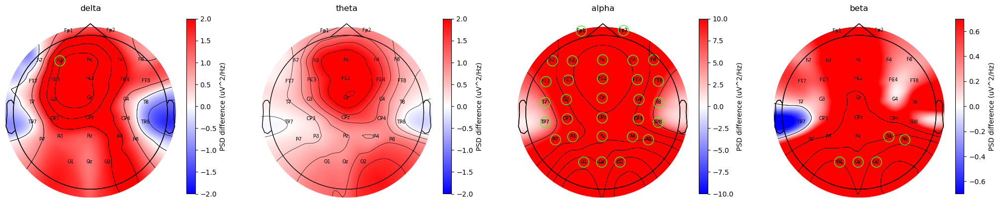

trigger: 41


100%|██████████| 26/26 [00:04<00:00,  5.82it/s]


Grand PSD difference ['imagery_42'] - ['fixation_6']


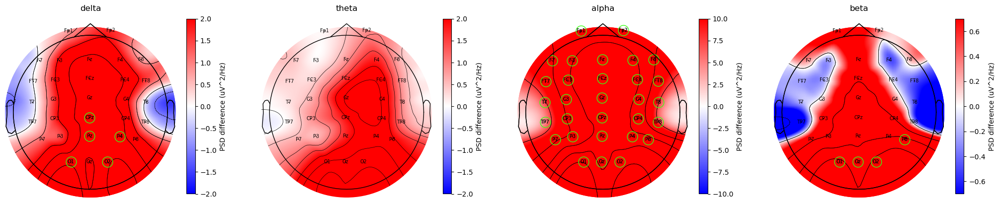

trigger: 42


100%|██████████| 26/26 [00:04<00:00,  5.80it/s]


Grand PSD difference ['imagery_43'] - ['fixation_6']


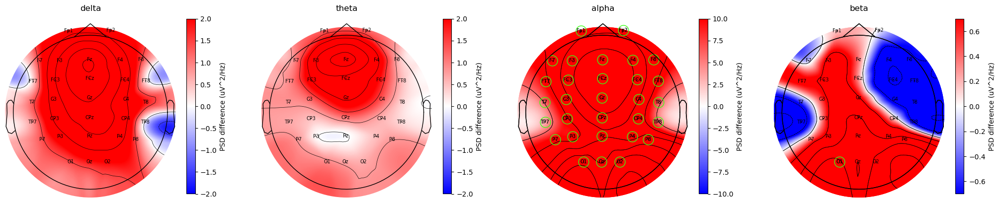

trigger: 43


100%|██████████| 26/26 [00:04<00:00,  5.80it/s]


Grand PSD difference ['imagery_44'] - ['fixation_6']


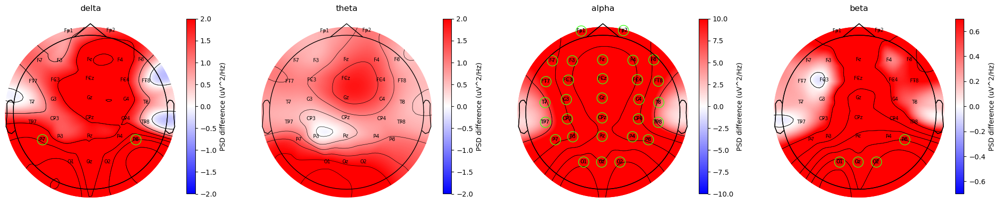

trigger: 44


100%|██████████| 26/26 [00:04<00:00,  5.80it/s]


Grand PSD difference ['imagery_45'] - ['fixation_6']


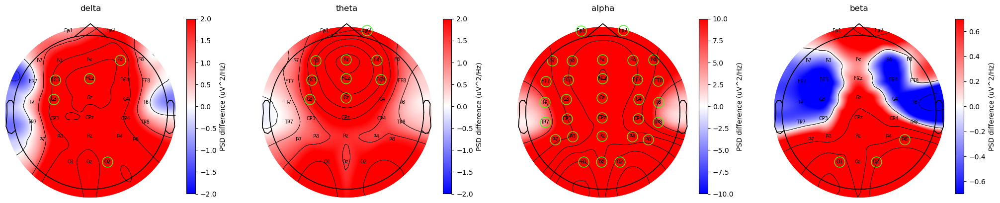

trigger: 45


100%|██████████| 26/26 [00:04<00:00,  5.77it/s]


Grand PSD difference ['imagery_46'] - ['fixation_6']


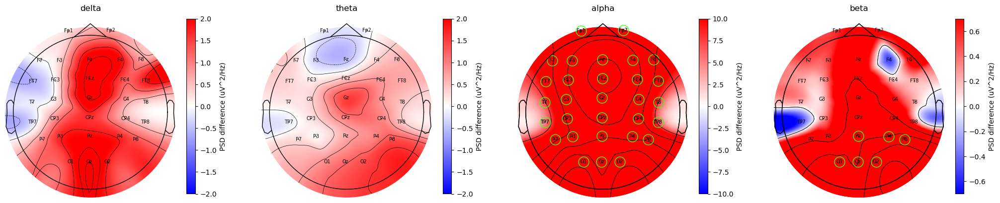

trigger: 46


100%|██████████| 26/26 [00:04<00:00,  5.68it/s]


Grand PSD difference ['imagery_47'] - ['fixation_6']


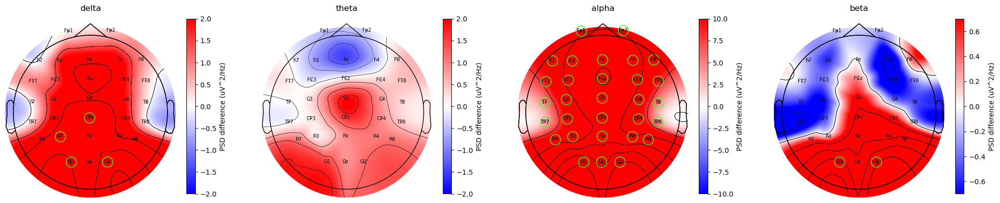

trigger: 47


In [9]:
for t in range(21, 48):
    plotGrandDeltaPSD(filt_trigger([f"imagery_{t}"], [], [], []), "task_epoch", "imagery",
                      filt_trigger([], [], ["fixation_fixation"], []), "task_epoch", "fixation", test="wilcoxon", vlims=[[-2, 2], [-2, 2], [-10, 10], [-0.7, 0.7]])
    print(f"trigger: {t}")